In [ ]:
# !pip install -U -q PyDrive
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials


In [ ]:
#auth.authenticate_user()
#gauth = GoogleAuth()
#gauth.credentials = GoogleCredentials.get_application_default()
#drive = GoogleDrive(gauth)

In [ ]:
#from google.colab import drive

In [ ]:
#drive.mount('/content/drive')
#drive.mount('/content/drive/MyDrive/Sleep Data/brux1.edf')

In [1]:
import os 
import sys
import time
import math
import re 
import datetime
from datetime import datetime, timedelta
import logging
import shutil
import copy 

from pprint import pprint

import numpy as np 
import pandas as pd 
import matplotlib 
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns
import seaborn

In [3]:
# !pip install mne

     ---------------------------------------- 7.7/7.7 MB 2.5 MB/s eta 0:00:00
     ---------------------------------------- 60.9/60.9 kB 1.6 MB/s eta 0:00:00


In [126]:
import mne

In [44]:
# data = mne.io.read_raw_edf('G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n8.edf')

Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n8.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [23]:
import traceback
from scipy import signal

In [24]:
def load_cap_ecg_data_mne(edf_file, fs_target=50, log=print):
    try:
        raw = mne.io.read_raw_edf(edf_file, preload=False)
        ch_idx = -1
        ch_name = None
        for cname in raw.info.get('ch_names'):
            ch_idx += 1
            if cname.find("ECG") > -1:
                ch_name = cname
                break
        hz = mne.pick_info(raw.info, [ch_idx], verbose=False)['sfreq']
        hz = int(hz)
        raw.pick_channels([ch_name])
        recording = raw.get_data().flatten()
        print(f"channel: {cname}")

    except Exception as e:
#         log(f"Error reading {edf_file}, caused by - {traceback.format_exc()}")
        print(f"Error occurred while loading EDF file: {edf_file}")
        traceback.print_exc()
        return None,None,None
    meta = {
        "hz": hz
    }
    # Down sample to 50Hz
    down_factor = meta["hz"] // fs_target
    target_samples = len(recording) // down_factor
    print(f"{edf_file}, @{meta['hz']}, down_factor:{down_factor}, recording:{recording.shape}, target:{target_samples}")
    recording = signal.resample(recording, target_samples)

    # Read annotation
    labels = []
    return (recording, labels, meta)

In [36]:
edf_file = "G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/brux1.edf"
recording, labels, meta = load_cap_ecg_data_mne(edf_file, fs_target=50)

if recording is None:
    # Handle the error
    print("Error occurred while loading EDF file.")
else:
    # Access the extracted data
    ecg_data = recording
    annotation_labels = labels
    meta_info = meta

Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\brux1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:3: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = mne.io.read_raw_edf(edf_file, preload=False)


channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/brux1.edf, @512, down_factor:10, recording:(7342592,), target:734259


In [35]:
print("ECG Data:")
print(ecg_data)
print("Annotation Labels:")
print(annotation_labels)

print("Meta Information:")
print(meta_info)

ECG Data:
[-2.31732324e-06 -1.76027044e-05 -2.11008904e-05 ... -6.74978491e-05
 -7.13739759e-05 -1.25788593e-04]
Annotation Labels:
[]
Meta Information:
{'hz': 256}


In [58]:
import shutil

In [59]:
def edf_to_csv(data_directory):
    # Find and read .edf files and corresponding .txt files for annotation.
    #
    count_file = 0
    ignore_file = 0
    bad_files = []
    record_names = []
    target_data_dir = f"{data_directory}/np_data"
    if not os.path.exists(target_data_dir):
        os.makedirs(target_data_dir)

    for f in os.listdir(data_directory):
        if not f.endswith(".edf"):
            continue
        rec_name = f[:-4]  # exclude .edf
        try:
            edf_path = f"{data_directory}/{f}"
            recording, _, _ = load_cap_ecg_data_mne(edf_path, fs_target=50)
            print(
                f"{count_file} | {f} | signal:{recording.shape}")
            record_names.append(rec_name)
            np.savetxt(f"{target_data_dir}/{f.replace('.edf', '.csv')}", recording)

            shutil.copy(f"{data_directory}/{f.replace('.edf', '.txt')}", target_data_dir)
            # rr_signal = generate_rr_signal(recording)
            # print(f"rr_signal")
            # break
        except:
            ignore_file += 1
            print(f"error loading {f}")
            traceback.print_exc(file=sys.stdout)
            bad_files.append(f)
            # Ignore corrupted recording.
            continue

        count_file += 1    
    print(f"{count_file} files created.")

In [60]:
data_directory = "G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0"
edf_to_csv(data_directory)


Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\brux1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:3: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = mne.io.read_raw_edf(edf_file, preload=False)


channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/brux1.edf, @512, down_factor:10, recording:(7342592,), target:734259
0 | brux1.edf | signal:(734259,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\brux2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/brux2.edf, @256, down_factor:5, recording:(8018176,), target:1603635
1 | brux2.edf | signal:(1603635,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\ins1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/ins1.edf, @256, down_factor:5, recording:(12288000,), target

C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:3: RuntimeWarning: Channel names are not unique, found duplicates for: {'CHIN'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_file, preload=False)
C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:13: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in an error because the following channel names are missing:
[None]
Either fix your included names or explicitly pass ordered=False.
  raw.pick_channels([ch_name])
Traceback (most recent call last):
  File "C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py", line 13, in load_cap_ecg_data_mne
    raw.pick_channels([ch_name])
  File "<decorator-gen-54>", line 12, in pick_channels
  File "<decorator-gen-53>", line 5, in pick_channels
  File "C:\Users\Mohammed Siam\anaconda3\lib\site-packages\mne\channels\channels.py", line 837, in p

channel: ECG
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n13.edf, @200, down_factor:4, recording:(5885400,), target:1471350
14 | n13.edf | signal:(1471350,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:3: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = mne.io.read_raw_edf(edf_file, preload=False)


channel: ECG
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n14.edf, @200, down_factor:4, recording:(5910200,), target:1477550
15 | n14.edf | signal:(1477550,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n15.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Error occurred while loading EDF file: G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n15.edf
error loading n15.edf
Traceback (most recent call last):
  File "C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\8131096.py", line 20, in edf_to_csv
    f"{count_file} | {f} | signal:{recording.shape}")
AttributeError: 'NoneType' object has no attribute 'shape'
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a

C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:13: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in an error because the following channel names are missing:
[None]
Either fix your included names or explicitly pass ordered=False.
  raw.pick_channels([ch_name])
Traceback (most recent call last):
  File "C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py", line 13, in load_cap_ecg_data_mne
    raw.pick_channels([ch_name])
  File "<decorator-gen-54>", line 12, in pick_channels
  File "<decorator-gen-53>", line 5, in pick_channels
  File "C:\Users\Mohammed Siam\anaconda3\lib\site-packages\mne\channels\channels.py", line 837, in pick_channels
    return self._pick_drop_channels(picks)
  File "<decorator-gen-56>", line 12, in _pick_drop_channels
  File "C:\Users\Mohammed Siam\anaconda3\lib\site-packages\mne\channels\channels.py", line 970, in _pick_drop_channels
    pick_in

Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n2.edf, @512, down_factor:10, recording:(22579200,), target:2257920
16 | n2.edf | signal:(2257920,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n3.edf, @512, down_factor:10, recording:(16927232,), target:1692723
17 | n3.edf | signal:(1692723,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...

C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:13: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in an error because the following channel names are missing:
[None]
Either fix your included names or explicitly pass ordered=False.
  raw.pick_channels([ch_name])
Traceback (most recent call last):
  File "C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py", line 13, in load_cap_ecg_data_mne
    raw.pick_channels([ch_name])
  File "<decorator-gen-54>", line 12, in pick_channels
  File "<decorator-gen-53>", line 5, in pick_channels
  File "C:\Users\Mohammed Siam\anaconda3\lib\site-packages\mne\channels\channels.py", line 837, in pick_channels
    return self._pick_drop_channels(picks)
  File "<decorator-gen-56>", line 12, in _pick_drop_channels
  File "C:\Users\Mohammed Siam\anaconda3\lib\site-packages\mne\channels\channels.py", line 970, in _pick_drop_channels
    pick_in

channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n5.edf, @512, down_factor:10, recording:(16097792,), target:1609779
18 | n5.edf | signal:(1609779,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n6.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n6.edf, @128, down_factor:2, recording:(4048000,), target:2024000
19 | n6.edf | signal:(2024000,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n7.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n7.edf, @128, down_factor:2, recording:(3781120,), target:1890560
20 | n7.edf | sign

C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:13: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in an error because the following channel names are missing:
[None]
Either fix your included names or explicitly pass ordered=False.
  raw.pick_channels([ch_name])
Traceback (most recent call last):
  File "C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py", line 13, in load_cap_ecg_data_mne
    raw.pick_channels([ch_name])
  File "<decorator-gen-54>", line 12, in pick_channels
  File "<decorator-gen-53>", line 5, in pick_channels
  File "C:\Users\Mohammed Siam\anaconda3\lib\site-packages\mne\channels\channels.py", line 837, in pick_channels
    return self._pick_drop_channels(picks)
  File "<decorator-gen-56>", line 12, in _pick_drop_channels
  File "C:\Users\Mohammed Siam\anaconda3\lib\site-packages\mne\channels\channels.py", line 970, in _pick_drop_channels
    pick_in

channel: ECG
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/n9.edf, @128, down_factor:2, recording:(4088448,), target:2044224
21 | n9.edf | signal:(2044224,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\narco1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/narco1.edf, @512, down_factor:10, recording:(17326080,), target:1732608
22 | narco1.edf | signal:(1732608,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\narco2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/narco2.edf, @512, down_factor:10, recording:(17648640,), targe

Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/nfle21.edf, @512, down_factor:10, recording:(17740800,), target:1774080
40 | nfle21.edf | signal:(1774080,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\nfle22.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/nfle22.edf, @512, down_factor:10, recording:(17111552,), target:1711155
41 | nfle22.edf | signal:(1711155,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\nfle23.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code 

58 | nfle38.edf | signal:(1732659,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\nfle39.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/nfle39.edf, @512, down_factor:10, recording:(15436800,), target:1543680
59 | nfle39.edf | signal:(1543680,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\nfle4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/nfle4.edf, @512, down_factor:10, recording:(17756160,), target:1775616
60 | nfle4.edf | signal:(1775616,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\n

C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_13460\1964581122.py:3: RuntimeWarning: Channel names are not unique, found duplicates for: {'Flusso'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_file, preload=False)


channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/plm1.edf, @256, down_factor:5, recording:(10106880,), target:2021376
67 | plm1.edf | signal:(2021376,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\plm10.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/plm10.edf, @512, down_factor:10, recording:(15421440,), target:1542144
68 | plm10.edf | signal:(1542144,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\plm2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/plm2.edf, @512, down_factor:10, recording:(13870080,), t

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/rbd18.edf, @512, down_factor:10, recording:(16896000,), target:1689600
86 | rbd18.edf | signal:(1689600,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\rbd19.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/rbd19.edf, @512, down_factor:10, recording:(17648640,), target:1764864
87 | rbd19.edf | signal:(1764864,)
Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\rbd2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
channel: ECG1-ECG2
G:/cap-sleep-database-1.0.

In [ ]:
raw_data = data.get_data()
channels = data.ch_names

In [ ]:
data_info = data.__dict__
data_info

{'preload': False,
 '_last_samps': array([7342591]),
 '_first_samps': array([0]),
 'info': <Info | 7 non-empty values
  bads: []
  ch_names: Fp2-F4, F4-C4, C4-P4, P4-O2, F8-T4, T4-T6, FP1-F3, F3-C3, C3-P3, ...
  chs: 18 EEG
  custom_ref_applied: False
  highpass: 0.3 Hz
  lowpass: 30.0 Hz
  meas_date: 2010-01-01 21:54:57 UTC
  nchan: 18
  projs: []
  sfreq: 512.0 Hz
 >,
 'buffer_size_sec': 1.0,
 '_cals': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1.]),
 '_raw_extras': [{'events': [],
   'units': array([1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-06,
          1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-06, 1.e-03,
          1.e-06, 1.e-06]),
   'ch_names': ['Fp2-F4',
    'F4-C4',
    'C4-P4',
    'P4-O2',
    'F8-T4',
    'T4-T6',
    'FP1-F3',
    'F3-C3',
    'C3-P3',
    'P3-O1',
    'F7-T3',
    'T3-T5',
    'C4-A1',
    'ROC-LOC',
    'EMG1-EMG2',
    'ECG1-ECG2',
    'DX1-DX2',
    'SX1-SX2'],
   'ch_types': ['EEG',


In [ ]:
data_info['info']['sfreq'] #['_raw_extras']#['sfreq']

512.0

In [127]:
data = mne.io.read_raw_edf('G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/brux1.edf')

Extracting EDF parameters from G:\cap-sleep-database-1.0.0\cap-sleep-database-1.0.0\brux1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


C:\Users\Mohammed Siam\AppData\Local\Temp\ipykernel_11024\583084297.py:1: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  data = mne.io.read_raw_edf('G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/brux1.edf')


In [145]:
df = data.to_data_frame()
df

,time,Fp2-F4,F4-C4,C4-P4,P4-O2,F8-T4,T4-T6,FP1-F3,F3-C3,C3-P3,P3-O1,F7-T3,T3-T5,C4-A1,ROC-LOC,EMG1-EMG2,ECG1-ECG2,DX1-DX2,SX1-SX2
0,0.000000,-11.920024,-6.761294,4.166667,-4.868742,-0.869963,12.530525,7.768620,-58.257021,1.663614,3.037241,2.793040,-0.381563,-1.602564,0.228910,-1.007162,-24.246956,5.982906,4.456654
1,0.001953,-8.470696,-7.036020,6.608669,-1.755189,-0.289988,6.700244,7.982295,-65.705128,0.351038,2.976190,2.304640,-0.106838,-1.114164,-0.164699,-0.701961,-18.356883,6.137699,4.393916
2,0.003906,-3.525641,-7.493895,10.332723,2.823565,-2.304640,-4.166667,8.134921,-69.703907,-0.686813,2.762515,1.663614,0.045788,-0.656288,-0.694070,2.990965,-14.816736,6.147201,4.347107
3,0.005859,1.358364,-8.257021,13.537851,6.547619,-4.258242,-13.385226,8.348596,-68.116606,-1.358364,2.365690,0.931013,0.137363,-0.503663,-1.352831,6.683891,-14.603107,6.052242,4.318080
4,0.007812,5.540293,-9.478022,15.613553,8.195971,-4.105617,-14.636752,8.440171,-61.340049,-1.755189,1.938339,0.259463,0.320513,-0.564713,-2.090709,6.714411,-17.288736,5.921856,4.304029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7342587,14340.990234,2.762515,4.197192,-0.992063,-3.617216,3.311966,-6.944444,1.755189,2.396215,1.663614,-1.266789,2.518315,-1.144689,-17.567155,22.607561,-0.244160,44.389172,0.471206,0.296920
7342588,14340.992188,2.793040,3.800366,-1.205739,-3.556166,2.731990,-7.127595,1.938339,2.640415,1.602564,-1.633089,2.884615,-0.961538,-15.430403,17.229276,-0.763001,43.961913,0.488400,0.122100
7342589,14340.994141,2.884615,3.311966,-1.236264,-3.464591,2.243590,-7.249695,2.121490,3.006716,1.724664,-1.999389,3.220391,-0.808913,-12.805250,7.508379,-1.403922,43.595691,0.506969,-0.055636
7342590,14340.996094,2.915140,2.854090,-1.114164,-3.281441,1.938339,-7.249695,2.365690,3.434066,1.877289,-2.365690,3.464591,-0.625763,-10.302198,-4.825008,-1.831203,43.259987,0.502557,-0.227795


In [ ]:
#slice1_df = df.iloc[512*0:512*3, 1:2]
#slice1_df

In [ ]:
#slice1_df = df.iloc[512*0:512*3, 1:2]
#slice1_df

In [ ]:
#slice7_df = df.iloc[512*2:512*5, 1:2]
#slice7_df

In [ ]:
#slice1_df.plot()

In [ ]:
#slice7_df.plot()

In [ ]:
#slice2_df = df.iloc[512*1:512*2, 1:2]
#slice2_df

In [ ]:
#slice1_df.plot()

In [ ]:
#slice2_df.plot()

In [ ]:
#slice0_df = df.iloc[512*0:512*1, 0:1]
#slice0_df.dtypes

***Function for basic argument passing***

In [ ]:
def print_column_values_range(df, column_name, start_index, end_index):
      
    label_values = df[column_name].values
    for i in range(start_index, end_index):
        print(label_values[i])

print_column_values_range(df,'ECG1-ECG2', 0 ,32)

-24.246955778679766
-18.35688344981231
-14.816736350596635
-14.603106784264657
-17.288735618152412
-21.469771416364026
-25.559251686147647
-28.51954710531938
-29.587694936979275
-28.763695181127357
-26.657918027283547
-24.582659382915736
-23.850215155491806
-23.39243751335185
-20.249031037324137
-13.290810876796778
-4.684591204565569
1.9684438612018194
4.837183751945556
4.409924619281595
0.9918515579699092
-5.355998413037507
-13.992736594744713
-23.880733664967806
-32.547990356151004
-36.11865596484268
-32.05969420453505
-21.652882473220007
-9.414960173345133
1.4801477095858644
11.337626270332958
19.5471053193762


In [ ]:
slice3_df = df.iloc[512*0:512*1, 3:5]
slice3_df

,C4-P4,P4-O2
0,4.166667,-4.868742
1,6.608669,-1.755189
2,10.332723,2.823565
3,13.537851,6.547619
4,15.613553,8.195971
...,...,...
507,0.259463,1.755189
508,0.595238,1.205739
509,0.564713,0.869963
510,0.137363,-0.808913


In [ ]:
#slice3_df.plot()

***function for printing column sequentially***

In [ ]:
def get_dataframe_by_index(dframe, start_index, end_index, start_column, end_column):
    return dframe.iloc[start_index:end_index, start_column:end_column]

slice4_df=get_dataframe_by_index(df,512*1,512*4,1,4)
slice4_df

,Fp2-F4,F4-C4,C4-P4
512,4.960317,30.998168,5.998168
513,5.265568,31.822344,5.357143
514,5.387668,32.219170,4.777167
515,5.173993,32.310745,4.319292
516,4.868742,32.158120,4.014042
...,...,...,...
2043,-0.076313,-4.105617,-7.097070
2044,-0.625763,-4.197192,-10.180098
2045,-1.022589,-4.197192,-12.164225
2046,-1.236264,-3.952991,-11.797924


In [ ]:
#slice4_df.plot()

In [ ]:
#df = data.to_data_frame()
#df

***function for exact column number***

In [ ]:
def get_dataframe_by_index(dframe, start_index, end_index, column1,column2,column3):
    return dframe.iloc[start_index:end_index, [column1,column2,column3]]

slice5_df=get_dataframe_by_index(df,512*1,512*4,1,4,5)
slice5_df

,Fp2-F4,P4-O2,F8-T4
512,4.960317,0.747863,0.503663
513,5.265568,0.808913,0.564713
514,5.387668,0.839438,0.564713
515,5.173993,0.778388,0.595238
516,4.868742,0.686813,0.595238
...,...,...,...
2043,-0.076313,0.137363,-54.166667
2044,-0.625763,-1.816239,-44.673382
2045,-1.022589,-2.854090,-35.760073
2046,-1.236264,-1.510989,-28.464591


In [ ]:
#slice10_df = df.iloc[512*0:512*3, 16:17]
#slice10_df
#slice10_df.plot()

In [ ]:
#slice10_df = df.iloc[512*3:512*6, 16:17]
#slice10_df
#slice10_df.plot()

In [ ]:
#slice10_df = df.iloc[512*0:, 16:17]
#slice10_df
#slice10_df.plot()

In [ ]:
#slice10_df = df.iloc[512*0:512*10, 16:17]
#slice10_df
#slice10_df.plot()

In [ ]:
#slice10_df = df.iloc[512*11:512*20, 16:17]
#slice10_df
#slice10_df.plot()


In [ ]:
import matplotlib 
plt.figure(figsize=(10,6))

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Axes: >

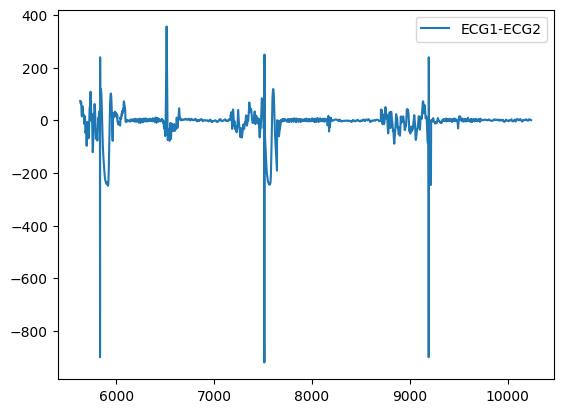

In [ ]:
slice10_df = df.iloc[512*11:512*20, 16:17]
slice10_df
slice10_df.plot()


In [ ]:
plt.rcParams['figure.figsize'] = [40, 6]

In [ ]:
import keras

In [94]:
# data_directory = "G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0"
def read_ecg_csv_files():
#     np_data_directory = "G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data"
    class_map = {
        "S0": 0,
        "S1": 1,
        "S2": 2,
        "S3": 3,
        "S4": 3,
        "REM": 4,
    }
    seg_count = 0
    seg_sz = 30 * 50  # 30s x 50Hz
    reached_sleep_stage_line = False
    np_data_directory = f"{data_directory}/np_data"
    
    for f in os.listdir(np_data_directory):
        if not f.endswith(".csv"):
            continue
        rec_name = f[:-4]
        sig_filepath = f"{np_data_directory}/{f}"
        ecg_sig = np.loadtxt(sig_filepath, delimiter=",")
        annot_filepath = sig_filepath.replace('.csv', '.txt')
        
        with open(annot_filepath, "r") as f:
            lines = f.readlines()
        
        print(f"[{rec_name}] {ecg_sig.shape}")
        start = 0
        ignored_annots_bad_len, ignored_annots_bad_label = 0, 0
        print(f"recording:{ecg_sig.shape}")
        
        for line in lines:
            tokens = line.split("\t")
            
            if not reached_sleep_stage_line and not line.startswith("Sleep Stage"):
                continue
            
            if line.startswith("Sleep Stage"):
                reached_sleep_stage_line = True
                continue
            
            try:
                tok_is_sleep = tokens[-3]
                if tok_is_sleep.find("SLEEP-") < 0:
                    continue
                label_str = tok_is_sleep.split("-")[-1]
                label = class_map.get(label_str)
                current_epoch_len = int(tokens[-2])
            except:
                print(f"--> error parsing epoch-len: {tokens[-2]}")
                ignored_annots_bad_len += 1
                continue
            
            if current_epoch_len != 30:  # not a valid sleep epoch
                ignored_annots_bad_len += 1
                print(f"--> bad length: {current_epoch_len}")
                continue
            
            seg = ecg_sig[start : start + seg_sz]
            if len(seg) > 0:
                print(f"recording:{ecg_sig.shape}, segment:{len(seg)}, {start} -> {start + seg_sz}")

            
            if len(seg) != seg_sz:
#                 print(f"bad seg_sz:{len(seg)}")
                start += seg_sz
                continue
            
            # update start
            start += seg_sz
            seg_count += 1
        print(f)
        
        print(f"...[{rec_name}], n_seg:{seg_count}, bad_label: {ignored_annots_bad_label}, bad_len/ignored: {ignored_annots_bad_len}, ")
        break


In [95]:
read_ecg_csv_files()

[brux1] (734259,)
recording:(734259,)
recording:(734259,), segment:1500, 0 -> 1500
recording:(734259,), segment:1500, 1500 -> 3000
recording:(734259,), segment:1500, 3000 -> 4500
recording:(734259,), segment:1500, 4500 -> 6000
recording:(734259,), segment:1500, 6000 -> 7500
recording:(734259,), segment:1500, 7500 -> 9000
recording:(734259,), segment:1500, 9000 -> 10500
recording:(734259,), segment:1500, 10500 -> 12000
recording:(734259,), segment:1500, 12000 -> 13500
recording:(734259,), segment:1500, 13500 -> 15000
recording:(734259,), segment:1500, 15000 -> 16500
recording:(734259,), segment:1500, 16500 -> 18000
recording:(734259,), segment:1500, 18000 -> 19500
recording:(734259,), segment:1500, 19500 -> 21000
recording:(734259,), segment:1500, 21000 -> 22500
recording:(734259,), segment:1500, 22500 -> 24000
recording:(734259,), segment:1500, 24000 -> 25500
recording:(734259,), segment:1500, 25500 -> 27000
recording:(734259,), segment:1500, 27000 -> 28500
recording:(734259,), segment

In [120]:
def read_csv_file(filename):
    data = np.genfromtxt(filename, delimiter=',', dtype=float)
    segment_count = len(data.flatten()) // 1500
    
    print("Total segments:", segment_count)
    
    for i in range(segment_count):
        segment = data[i*1500 : (i+1)*1500]
        print(f"Segment {i+1}: First value = {segment[0]}, Last value = {segment[-1]}")
    
    remaining_rows = len(data) % 1500
    if remaining_rows > 0:
        last_segment = data[-remaining_rows:]
        print(f"Remaining Rows: First value = {last_segment[0]}, Last value = {last_segment[-1]}")

In [122]:
read_csv_file("G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/brux2.csv")

Total segments: 1069
Segment 1: First value = -2.3173232447685294e-06, Last value = -1.4687092882496054e-05
Segment 2: First value = 1.545739699427057e-05, Last value = -2.5875531936199006e-05
Segment 3: First value = -2.044678635354362e-05, Last value = 2.3908666956180367e-05
Segment 4: First value = 5.548132896392522e-05, Last value = -1.681724830463823e-05
Segment 5: First value = -1.9745932401656082e-05, Last value = -1.7665633612243477e-05
Segment 6: First value = 1.6602112846725737e-06, Last value = 5.255186556177253e-06
Segment 7: First value = 3.0373203138707487e-05, Last value = -3.263737686164925e-05
Segment 8: First value = -1.8167336295128756e-05, Last value = -4.396440531524525e-05
Segment 9: First value = -1.5190205213771651e-06, Last value = -1.4464007173644545e-06
Segment 10: First value = 2.4576880362538e-05, Last value = 6.619246801287026e-05
Segment 11: First value = -4.36507042094698e-06, Last value = -1.9067818601846304e-05
Segment 12: First value = 9.6116057892182

In [174]:

def read_csv_file(folder_path, output_file):
    segment_info = []

    for filename in os.listdir(folder_path):
        if filename.endswith(".csv"):
            file_path = os.path.join(folder_path, filename)
            try:
                df = pd.read_csv(file_path,header=None)
                if df.empty or len(df.columns) == 0:
                    continue  # Skip empty or column-less files

                data = df.values.flatten()
                segment_count = (len(data) + 1499) // 1500  # Adjust segment count

                print(f"File: {filename}")
                print("Total segments:", segment_count)

                for i in range(segment_count):
                    segment_start = i * 1500
                    segment_end = (i + 1) * 1500
                    segment = data[segment_start:segment_end]
                    start_index = segment_start
                    start_value = segment[0]

                    print(f"Segment {i}: Start Index = {start_index}, Start Value = {start_value}")
                    segment_info.append({'Filename': filename, 'Start Index': start_index, 'Start Value': start_value})

                remaining_rows = len(data) % 1500
                if remaining_rows > 0:
                    last_segment_start = len(data) - remaining_rows
                    last_segment = data[last_segment_start:]
                    start_index = last_segment_start
                    start_value = last_segment[0]

                    print(f"Remaining Rows: Start Index = {start_index}, Start Value = {start_value}")
                    segment_info.append({'Filename': filename, 'Start Index': start_index, 'Start Value': start_value})

                print()

            except pd.errors.EmptyDataError:
                continue  # Skip empty files

    df_output = pd.DataFrame(segment_info)
    df_output.to_csv(output_file, index=False)


In [175]:
folder_path = "G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data"
output_file = "G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/output5.csv"
read_csv_file(folder_path, output_file)

File: brux1.csv
Total segments: 490
Segment 0: Start Index = 0, Start Value = 3.1528180116533914e-06
Segment 1: Start Index = 1500, Start Value = -6.058599464346541e-06
Segment 2: Start Index = 3000, Start Value = -4.130892585975091e-06
Segment 3: Start Index = 4500, Start Value = 1.477935318573333e-07
Segment 4: Start Index = 6000, Start Value = -2.150677072875533e-06
Segment 5: Start Index = 7500, Start Value = -4.499576214170876e-06
Segment 6: Start Index = 9000, Start Value = -1.7515699010501263e-05
Segment 7: Start Index = 10500, Start Value = -4.797597543563684e-06
Segment 8: Start Index = 12000, Start Value = 4.921735699025573e-06
Segment 9: Start Index = 13500, Start Value = 2.1048822648228376e-05
Segment 10: Start Index = 15000, Start Value = 8.076669819688826e-07
Segment 11: Start Index = 16500, Start Value = 4.006591011737209e-06
Segment 12: Start Index = 18000, Start Value = 2.8533912315848133e-07
Segment 13: Start Index = 19500, Start Value = 6.60253164469168e-08
Segment 1

File: brux2.csv
Total segments: 1070
Segment 0: Start Index = 0, Start Value = -2.3173232447685294e-06
Segment 1: Start Index = 1500, Start Value = 1.545739699427057e-05
Segment 2: Start Index = 3000, Start Value = -2.044678635354362e-05
Segment 3: Start Index = 4500, Start Value = 5.548132896392522e-05
Segment 4: Start Index = 6000, Start Value = -1.974593240165608e-05
Segment 5: Start Index = 7500, Start Value = 1.6602112846725737e-06
Segment 6: Start Index = 9000, Start Value = 3.0373203138707487e-05
Segment 7: Start Index = 10500, Start Value = -1.8167336295128756e-05
Segment 8: Start Index = 12000, Start Value = -1.5190205213771651e-06
Segment 9: Start Index = 13500, Start Value = 2.4576880362538e-05
Segment 10: Start Index = 15000, Start Value = -4.36507042094698e-06
Segment 11: Start Index = 16500, Start Value = 9.611605789218266e-06
Segment 12: Start Index = 18000, Start Value = 0.000309057207012763
Segment 13: Start Index = 19500, Start Value = 5.7277240338584965e-05
Segment 1

File: ins1.csv
Total segments: 1639
Segment 0: Start Index = 0, Start Value = -3.396151865211241e-05
Segment 1: Start Index = 1500, Start Value = 2.3854016246836327e-05
Segment 2: Start Index = 3000, Start Value = -0.00020889920387555952
Segment 3: Start Index = 4500, Start Value = 4.83037225649148e-05
Segment 4: Start Index = 6000, Start Value = -8.705863998834141e-05
Segment 5: Start Index = 7500, Start Value = -0.00011985243257962424
Segment 6: Start Index = 9000, Start Value = -0.00015529850476449453
Segment 7: Start Index = 10500, Start Value = 5.422888949708482e-05
Segment 8: Start Index = 12000, Start Value = -0.00015235386894388287
Segment 9: Start Index = 13500, Start Value = 6.898283298530878e-05
Segment 10: Start Index = 15000, Start Value = -6.120836196827836e-05
Segment 11: Start Index = 16500, Start Value = 7.898656410350174e-06
Segment 12: Start Index = 18000, Start Value = -1.5857932867176357e-05
Segment 13: Start Index = 19500, Start Value = 0.00012866933117187065
Segm

File: ins2.csv
Total segments: 1716
Segment 0: Start Index = 0, Start Value = -2.3084682624487146e-05
Segment 1: Start Index = 1500, Start Value = -0.00010416107969094828
Segment 2: Start Index = 3000, Start Value = -2.582927577244816e-05
Segment 3: Start Index = 4500, Start Value = -0.00012485200729770723
Segment 4: Start Index = 6000, Start Value = 4.392628667547655e-05
Segment 5: Start Index = 7500, Start Value = 1.5947291353951825e-06
Segment 6: Start Index = 9000, Start Value = -5.520583299253545e-06
Segment 7: Start Index = 10500, Start Value = 5.3465324003434336e-05
Segment 8: Start Index = 12000, Start Value = 1.6021509732991335e-05
Segment 9: Start Index = 13500, Start Value = 6.361285705729784e-05
Segment 10: Start Index = 15000, Start Value = 1.2705527033304e-05
Segment 11: Start Index = 16500, Start Value = 3.159813218540788e-05
Segment 12: Start Index = 18000, Start Value = 4.1187517803782515e-05
Segment 13: Start Index = 19500, Start Value = -0.0001235325473900916
Segment

File: ins3.csv
Total segments: 1055
Segment 0: Start Index = 0, Start Value = -6.535679988637835e-06
Segment 1: Start Index = 1500, Start Value = -7.475937437922069e-05
Segment 2: Start Index = 3000, Start Value = -4.398198718653855e-05
Segment 3: Start Index = 4500, Start Value = 6.296852249127783e-05
Segment 4: Start Index = 6000, Start Value = -8.451070468816531e-05
Segment 5: Start Index = 7500, Start Value = 2.3386112980840364e-05
Segment 6: Start Index = 9000, Start Value = -6.1033459450215995e-05
Segment 7: Start Index = 10500, Start Value = -1.597369903752978e-05
Segment 8: Start Index = 12000, Start Value = -3.609692482862313e-05
Segment 9: Start Index = 13500, Start Value = -1.6876114216652012e-06
Segment 10: Start Index = 15000, Start Value = 4.350064241939915e-05
Segment 11: Start Index = 16500, Start Value = -5.4701143038696193e-05
Segment 12: Start Index = 18000, Start Value = 8.466425515442546e-06
Segment 13: Start Index = 19500, Start Value = -2.6103925603367045e-05
Seg

File: ins4.csv
Total segments: 1304
Segment 0: Start Index = 0, Start Value = 3.3518434836991704e-05
Segment 1: Start Index = 1500, Start Value = 0.00026791642675177973
Segment 2: Start Index = 3000, Start Value = 8.872135281681257e-05
Segment 3: Start Index = 4500, Start Value = -3.082974082678218e-05
Segment 4: Start Index = 6000, Start Value = 1.6628583836152784e-05
Segment 5: Start Index = 7500, Start Value = 8.474937353632078e-06
Segment 6: Start Index = 9000, Start Value = -3.953316843093924e-05
Segment 7: Start Index = 10500, Start Value = 1.6820510440442506e-05
Segment 8: Start Index = 12000, Start Value = 2.5387693301139568e-05
Segment 9: Start Index = 13500, Start Value = 8.906214132556153e-05
Segment 10: Start Index = 15000, Start Value = -9.209761180649176e-05
Segment 11: Start Index = 16500, Start Value = 0.00011256917863053312
Segment 12: Start Index = 18000, Start Value = 3.628452362961702e-05
Segment 13: Start Index = 19500, Start Value = -0.00011545676517969924
Segment

File: ins5.csv
Total segments: 1762
Segment 0: Start Index = 0, Start Value = 5.4361834434862126e-05
Segment 1: Start Index = 1500, Start Value = 2.5254817422581025e-05
Segment 2: Start Index = 3000, Start Value = -5.584203484948361e-05
Segment 3: Start Index = 4500, Start Value = 7.544968537500458e-05
Segment 4: Start Index = 6000, Start Value = 6.034340525752647e-05
Segment 5: Start Index = 7500, Start Value = 4.521667352696716e-06
Segment 6: Start Index = 9000, Start Value = 0.00014687592552557044
Segment 7: Start Index = 10500, Start Value = 2.8893615795427016e-05
Segment 8: Start Index = 12000, Start Value = -0.0002571746646129512
Segment 9: Start Index = 13500, Start Value = 5.986245287440611e-05
Segment 10: Start Index = 15000, Start Value = 5.0683256728558526e-05
Segment 11: Start Index = 16500, Start Value = 2.1195359753939688e-05
Segment 12: Start Index = 18000, Start Value = -3.291328043422914e-05
Segment 13: Start Index = 19500, Start Value = -6.534518238243864e-05
Segment 

File: ins6.csv
Total segments: 1649
Segment 0: Start Index = 0, Start Value = 6.829087503811031e-05
Segment 1: Start Index = 1500, Start Value = -5.460814718233015e-05
Segment 2: Start Index = 3000, Start Value = 0.00014201858754456703
Segment 3: Start Index = 4500, Start Value = -2.793060686475706e-05
Segment 4: Start Index = 6000, Start Value = 2.6053651884091828e-05
Segment 5: Start Index = 7500, Start Value = -0.0002837379958493255
Segment 6: Start Index = 9000, Start Value = -0.0001021617481805838
Segment 7: Start Index = 10500, Start Value = -5.4550180613783753e-05
Segment 8: Start Index = 12000, Start Value = -4.601151504454536e-07
Segment 9: Start Index = 13500, Start Value = -6.06194362438336e-05
Segment 10: Start Index = 15000, Start Value = 3.496526329222076e-05
Segment 11: Start Index = 16500, Start Value = -1.3520517100687406e-06
Segment 12: Start Index = 18000, Start Value = 7.57904713052631e-05
Segment 13: Start Index = 19500, Start Value = -3.503603669845157e-05
Segment

File: ins7.csv
Total segments: 1519
Segment 0: Start Index = 0, Start Value = 3.463626018421203e-05
Segment 1: Start Index = 1500, Start Value = 7.196196613950523e-05
Segment 2: Start Index = 3000, Start Value = 9.052973339820071e-06
Segment 3: Start Index = 4500, Start Value = -4.4376636294323454e-05
Segment 4: Start Index = 6000, Start Value = 4.692037700457914e-05
Segment 5: Start Index = 7500, Start Value = 6.994358080633149e-05
Segment 6: Start Index = 9000, Start Value = 1.1759076332181292e-05
Segment 7: Start Index = 10500, Start Value = 3.956918002045135e-05
Segment 8: Start Index = 12000, Start Value = 9.57451766007228e-05
Segment 9: Start Index = 13500, Start Value = 8.547501963476296e-05
Segment 10: Start Index = 15000, Start Value = -0.00019140679569096887
Segment 11: Start Index = 16500, Start Value = 6.205096421461553e-05
Segment 12: Start Index = 18000, Start Value = -0.00010391924830020951
Segment 13: Start Index = 19500, Start Value = 7.423420049955578e-05
Segment 14: 

File: ins8.csv
Total segments: 1024
Segment 0: Start Index = 0, Start Value = -8.606674697283608e-05
Segment 1: Start Index = 1500, Start Value = 6.513781065112054e-05
Segment 2: Start Index = 3000, Start Value = 6.406864077905217e-05
Segment 3: Start Index = 4500, Start Value = -8.796254096887235e-05
Segment 4: Start Index = 6000, Start Value = -8.07645787392009e-06
Segment 5: Start Index = 7500, Start Value = 5.580543006205296e-05
Segment 6: Start Index = 9000, Start Value = 4.7226379926041695e-05
Segment 7: Start Index = 10500, Start Value = 5.114815559469354e-05
Segment 8: Start Index = 12000, Start Value = -0.00013556809052401306
Segment 9: Start Index = 13500, Start Value = 7.17133516432193e-05
Segment 10: Start Index = 15000, Start Value = 0.00012333684123895313
Segment 11: Start Index = 16500, Start Value = 2.2051278795967333e-05
Segment 12: Start Index = 18000, Start Value = 3.057362129072675e-05
Segment 13: Start Index = 19500, Start Value = 2.112022900630085e-05
Segment 14: 

File: ins9.csv
Total segments: 1144
Segment 0: Start Index = 0, Start Value = -9.932800464416883e-05
Segment 1: Start Index = 1500, Start Value = 3.0854474572047716e-05
Segment 2: Start Index = 3000, Start Value = -6.625686724401838e-06
Segment 3: Start Index = 4500, Start Value = -0.00011363884537092329
Segment 4: Start Index = 6000, Start Value = -0.0002562689805241803
Segment 5: Start Index = 7500, Start Value = -1.3691262640829232e-05
Segment 6: Start Index = 9000, Start Value = 1.6914422300225297e-05
Segment 7: Start Index = 10500, Start Value = -4.4864961963490286e-05
Segment 8: Start Index = 12000, Start Value = 2.2375445261141175e-05
Segment 9: Start Index = 13500, Start Value = 2.3099352442480484e-05
Segment 10: Start Index = 15000, Start Value = -5.221148998777849e-05
Segment 11: Start Index = 16500, Start Value = -7.843077457873297e-05
Segment 12: Start Index = 18000, Start Value = 3.649711298861949e-05
Segment 13: Start Index = 19500, Start Value = -3.56389900663847e-05
Seg

File: n1.csv
Total segments: 1182
Segment 0: Start Index = 0, Start Value = 6.630406487328606e-06
Segment 1: Start Index = 1500, Start Value = 5.1756964333569646e-05
Segment 2: Start Index = 3000, Start Value = -5.01601843509576e-05
Segment 3: Start Index = 4500, Start Value = -1.4076290219178115e-05
Segment 4: Start Index = 6000, Start Value = 1.8960486824265648e-05
Segment 5: Start Index = 7500, Start Value = 2.896506518321512e-05
Segment 6: Start Index = 9000, Start Value = -9.958706461272636e-05
Segment 7: Start Index = 10500, Start Value = -4.353329822719164e-05
Segment 8: Start Index = 12000, Start Value = -5.170628463979023e-05
Segment 9: Start Index = 13500, Start Value = 3.181671941656826e-05
Segment 10: Start Index = 15000, Start Value = 2.8465389172982312e-05
Segment 11: Start Index = 16500, Start Value = 1.3835807189699855e-05
Segment 12: Start Index = 18000, Start Value = 3.63429027082256e-05
Segment 13: Start Index = 19500, Start Value = 8.93101935164895e-06
Segment 14: S

File: n10.csv
Total segments: 1004
Segment 0: Start Index = 0, Start Value = -7.570475245505421e-06
Segment 1: Start Index = 1500, Start Value = 7.05936139600625e-05
Segment 2: Start Index = 3000, Start Value = -2.0614636293848194e-05
Segment 3: Start Index = 4500, Start Value = -0.00021233439654781396
Segment 4: Start Index = 6000, Start Value = -7.615825328563526e-05
Segment 5: Start Index = 7500, Start Value = -0.00019560374852662385
Segment 6: Start Index = 9000, Start Value = 1.1167722148877096e-05
Segment 7: Start Index = 10500, Start Value = 3.453186455854709e-05
Segment 8: Start Index = 12000, Start Value = 3.641043726881794e-05
Segment 9: Start Index = 13500, Start Value = -3.1830445684227e-05
Segment 10: Start Index = 15000, Start Value = 7.812160511761012e-06
Segment 11: Start Index = 16500, Start Value = -0.0004539962365183092
Segment 12: Start Index = 18000, Start Value = -6.820219893227406e-05
Segment 13: Start Index = 19500, Start Value = 1.7881680860574243e-05
Segment 1

File: n11.csv
Total segments: 1080
Segment 0: Start Index = 0, Start Value = -1.8930907302523842e-05
Segment 1: Start Index = 1500, Start Value = 3.5150160003326e-05
Segment 2: Start Index = 3000, Start Value = 3.404211620953885e-05
Segment 3: Start Index = 4500, Start Value = -0.00019406176714871533
Segment 4: Start Index = 6000, Start Value = -0.00010975240599312264
Segment 5: Start Index = 7500, Start Value = 1.8208296189409624e-05
Segment 6: Start Index = 9000, Start Value = -9.845496445970871e-06
Segment 7: Start Index = 10500, Start Value = 2.7884835587966484e-05
Segment 8: Start Index = 12000, Start Value = 3.2784418287465005e-05
Segment 9: Start Index = 13500, Start Value = 3.467254772053295e-05
Segment 10: Start Index = 15000, Start Value = 3.425504708843569e-05
Segment 11: Start Index = 16500, Start Value = 2.1782361217043827e-05
Segment 12: Start Index = 18000, Start Value = -4.677813834239172e-05
Segment 13: Start Index = 19500, Start Value = 2.218981635029879e-05
Segment 1

File: n13.csv
Total segments: 981
Segment 0: Start Index = 0, Start Value = 129.01640388845647
Segment 1: Start Index = 1500, Start Value = 129.30522232269135
Segment 2: Start Index = 3000, Start Value = 127.72753669184772
Segment 3: Start Index = 4500, Start Value = 128.635147364909
Segment 4: Start Index = 6000, Start Value = 126.57348246785048
Segment 5: Start Index = 7500, Start Value = 129.31402819525948
Segment 6: Start Index = 9000, Start Value = 126.53166236832708
Segment 7: Start Index = 10500, Start Value = -5.315664733245072
Segment 8: Start Index = 12000, Start Value = 123.0769888980734
Segment 9: Start Index = 13500, Start Value = 123.15005284482416
Segment 10: Start Index = 15000, Start Value = 146.767167837998
Segment 11: Start Index = 16500, Start Value = 121.58367179535423
Segment 12: Start Index = 18000, Start Value = 117.5025012460456
Segment 13: Start Index = 19500, Start Value = 125.6352262088575
Segment 14: Start Index = 21000, Start Value = 8.781955446016038
Segm

File: n14.csv
Total segments: 986
Segment 0: Start Index = 0, Start Value = 522.2759180437673
Segment 1: Start Index = 1500, Start Value = 507.00139940743617
Segment 2: Start Index = 3000, Start Value = 515.1512001836749
Segment 3: Start Index = 4500, Start Value = 512.4900298403993
Segment 4: Start Index = 6000, Start Value = 520.1578282140777
Segment 5: Start Index = 7500, Start Value = 519.7285273451032
Segment 6: Start Index = 9000, Start Value = 512.8484753685074
Segment 7: Start Index = 10500, Start Value = 471.74245691646576
Segment 8: Start Index = 12000, Start Value = 507.0732786706928
Segment 9: Start Index = 13500, Start Value = 444.47604702280125
Segment 10: Start Index = 15000, Start Value = 564.9929313517914
Segment 11: Start Index = 16500, Start Value = 533.8656738843716
Segment 12: Start Index = 18000, Start Value = 357.529687827652
Segment 13: Start Index = 19500, Start Value = 620.4347647711464
Segment 14: Start Index = 21000, Start Value = 471.65461047762506
Segment 

File: n2.csv
Total segments: 1506
Segment 0: Start Index = 0, Start Value = -1.523785200279777e-05
Segment 1: Start Index = 1500, Start Value = -8.582730985068122e-05
Segment 2: Start Index = 3000, Start Value = 1.6423340451634774e-05
Segment 3: Start Index = 4500, Start Value = -0.00010524477690323198
Segment 4: Start Index = 6000, Start Value = 2.1185122373549483e-05
Segment 5: Start Index = 7500, Start Value = -7.098227318722242e-05
Segment 6: Start Index = 9000, Start Value = 5.499709636741828e-05
Segment 7: Start Index = 10500, Start Value = -1.971938928984397e-05
Segment 8: Start Index = 12000, Start Value = -1.8695078478668425e-05
Segment 9: Start Index = 13500, Start Value = 1.2287178746138275e-05
Segment 10: Start Index = 15000, Start Value = 2.756426310462216e-05
Segment 11: Start Index = 16500, Start Value = 6.146799853761825e-05
Segment 12: Start Index = 18000, Start Value = 2.9910812962876593e-05
Segment 13: Start Index = 19500, Start Value = -1.131563567762916e-05
Segment

File: n3.csv
Total segments: 1129
Segment 0: Start Index = 0, Start Value = 3.619759439738988e-05
Segment 1: Start Index = 1500, Start Value = 2.270706632022616e-05
Segment 2: Start Index = 3000, Start Value = -0.00013747929161518185
Segment 3: Start Index = 4500, Start Value = 9.006220583159249e-05
Segment 4: Start Index = 6000, Start Value = -4.964401880823946e-05
Segment 5: Start Index = 7500, Start Value = -0.00012738852092661942
Segment 6: Start Index = 9000, Start Value = 0.00012339939260877226
Segment 7: Start Index = 10500, Start Value = -2.5462397444272688e-05
Segment 8: Start Index = 12000, Start Value = -0.00012481719007900947
Segment 9: Start Index = 13500, Start Value = 5.250239552959034e-05
Segment 10: Start Index = 15000, Start Value = 4.9036983163613065e-05
Segment 11: Start Index = 16500, Start Value = 5.5539179888320167e-05
Segment 12: Start Index = 18000, Start Value = -0.00010055968295361683
Segment 13: Start Index = 19500, Start Value = 3.562629561436066e-05
Segmen

File: n5.csv
Total segments: 1074
Segment 0: Start Index = 0, Start Value = 1.1300698044257068e-06
Segment 1: Start Index = 1500, Start Value = -5.146391071373355e-05
Segment 2: Start Index = 3000, Start Value = 1.109272782236793e-05
Segment 3: Start Index = 4500, Start Value = 1.4317378103691259e-05
Segment 4: Start Index = 6000, Start Value = -0.0001692762119487399
Segment 5: Start Index = 7500, Start Value = -2.05287809507104e-05
Segment 6: Start Index = 9000, Start Value = 4.356616757944952e-06
Segment 7: Start Index = 10500, Start Value = 8.898096793441277e-06
Segment 8: Start Index = 12000, Start Value = 1.6093579427041266e-05
Segment 9: Start Index = 13500, Start Value = 3.5022692937781846e-05
Segment 10: Start Index = 15000, Start Value = -2.4627485522576164e-05
Segment 11: Start Index = 16500, Start Value = 3.201108462485241e-05
Segment 12: Start Index = 18000, Start Value = 2.183104954453596e-05
Segment 13: Start Index = 19500, Start Value = -0.00017638929558867395
Segment 14

File: n6.csv
Total segments: 1350
Segment 0: Start Index = 0, Start Value = 7.294726598703937e-07
Segment 1: Start Index = 1500, Start Value = 2.8737493354287243e-07
Segment 2: Start Index = 3000, Start Value = 1.596548751180301e-07
Segment 3: Start Index = 4500, Start Value = 1.4947013142086113e-05
Segment 4: Start Index = 6000, Start Value = -1.192574121639238e-06
Segment 5: Start Index = 7500, Start Value = -1.0525484644524671e-06
Segment 6: Start Index = 9000, Start Value = -1.3762565695730986e-06
Segment 7: Start Index = 10500, Start Value = -1.169074971302662e-06
Segment 8: Start Index = 12000, Start Value = -1.1908161405699375e-06
Segment 9: Start Index = 13500, Start Value = -1.1695900616829748e-06
Segment 10: Start Index = 15000, Start Value = -9.253760616491e-07
Segment 11: Start Index = 16500, Start Value = -1.1657300204835247e-06
Segment 12: Start Index = 18000, Start Value = -2.9087540688958353e-08
Segment 13: Start Index = 19500, Start Value = -4.694502345873988e-06
Segme

File: n7.csv
Total segments: 1261
Segment 0: Start Index = 0, Start Value = 9.11539374273793e-07
Segment 1: Start Index = 1500, Start Value = 1.7824424995961178e-06
Segment 2: Start Index = 3000, Start Value = 7.965694976510145e-07
Segment 3: Start Index = 4500, Start Value = 8.638521774886925e-07
Segment 4: Start Index = 6000, Start Value = 1.0212598441868407e-06
Segment 5: Start Index = 7500, Start Value = 9.344600389148666e-07
Segment 6: Start Index = 9000, Start Value = 9.865385187681146e-07
Segment 7: Start Index = 10500, Start Value = 1.1408196187697308e-06
Segment 8: Start Index = 12000, Start Value = 4.4088411209871535e-06
Segment 9: Start Index = 13500, Start Value = 4.152315365204022e-06
Segment 10: Start Index = 15000, Start Value = 6.193667771460508e-06
Segment 11: Start Index = 16500, Start Value = -1.7615234967899507e-05
Segment 12: Start Index = 18000, Start Value = 6.123660243739663e-06
Segment 13: Start Index = 19500, Start Value = 6.993476191039116e-07
Segment 14: Sta

File: n9.csv
Total segments: 1363
Segment 0: Start Index = 0, Start Value = 1.8381487239085951e-06
Segment 1: Start Index = 1500, Start Value = 2.2145477580627926e-06
Segment 2: Start Index = 3000, Start Value = 1.362069868160872e-05
Segment 3: Start Index = 4500, Start Value = 1.1335636345303368e-05
Segment 4: Start Index = 6000, Start Value = 1.216810019555316e-05
Segment 5: Start Index = 7500, Start Value = 3.4099460291973487e-06
Segment 6: Start Index = 9000, Start Value = 1.376682830363132e-06
Segment 7: Start Index = 10500, Start Value = 5.261399809809722e-06
Segment 8: Start Index = 12000, Start Value = -3.5810485615400894e-06
Segment 9: Start Index = 13500, Start Value = 4.20836019858609e-06
Segment 10: Start Index = 15000, Start Value = 3.598453791355713e-06
Segment 11: Start Index = 16500, Start Value = 1.8823495185540704e-05
Segment 12: Start Index = 18000, Start Value = 1.0376162674481468e-06
Segment 13: Start Index = 19500, Start Value = -1.6221269790900555e-06
Segment 14:

File: narco1.csv
Total segments: 1156
Segment 0: Start Index = 0, Start Value = -0.00012419203140209028
Segment 1: Start Index = 1500, Start Value = -4.416055382903073e-05
Segment 2: Start Index = 3000, Start Value = -5.546379002478126e-05
Segment 3: Start Index = 4500, Start Value = 8.905574075780359e-06
Segment 4: Start Index = 6000, Start Value = 1.258153266141696e-05
Segment 5: Start Index = 7500, Start Value = -9.712980247265726e-06
Segment 6: Start Index = 9000, Start Value = 2.052724676568703e-05
Segment 7: Start Index = 10500, Start Value = -4.208698178517852e-05
Segment 8: Start Index = 12000, Start Value = 6.5209504817428235e-06
Segment 9: Start Index = 13500, Start Value = 2.598399559461669e-05
Segment 10: Start Index = 15000, Start Value = 1.3853197269491538e-05
Segment 11: Start Index = 16500, Start Value = 1.9905582419051264e-05
Segment 12: Start Index = 18000, Start Value = 5.728627956054631e-06
Segment 13: Start Index = 19500, Start Value = 1.416058458975678e-05
Segment

File: narco2.csv
Total segments: 1177
Segment 0: Start Index = 0, Start Value = 6.571584281165651e-06
Segment 1: Start Index = 1500, Start Value = 4.875093865530896e-05
Segment 2: Start Index = 3000, Start Value = 2.5625798376840776e-05
Segment 3: Start Index = 4500, Start Value = 4.920856760791676e-05
Segment 4: Start Index = 6000, Start Value = -0.00012756812311046504
Segment 5: Start Index = 7500, Start Value = -0.0001100321607728394
Segment 6: Start Index = 9000, Start Value = 3.8027749629794986e-05
Segment 7: Start Index = 10500, Start Value = 5.556637095693028e-05
Segment 8: Start Index = 12000, Start Value = -0.00039818433536823296
Segment 9: Start Index = 13500, Start Value = -3.609182822313227e-05
Segment 10: Start Index = 15000, Start Value = 4.441874892716829e-05
Segment 11: Start Index = 16500, Start Value = 3.7752606243801566e-05
Segment 12: Start Index = 18000, Start Value = 6.275132939006368e-05
Segment 13: Start Index = 19500, Start Value = -8.716169528802251e-05
Segmen

File: narco3.csv
Total segments: 1572
Segment 0: Start Index = 0, Start Value = -6.265610965785432e-05
Segment 1: Start Index = 1500, Start Value = 1.2918895768665212e-05
Segment 2: Start Index = 3000, Start Value = 4.810117645890932e-06
Segment 3: Start Index = 4500, Start Value = 0.0001611672972274237
Segment 4: Start Index = 6000, Start Value = 4.881077117736423e-05
Segment 5: Start Index = 7500, Start Value = -4.9083709715277627e-05
Segment 6: Start Index = 9000, Start Value = -0.00017496881488624142
Segment 7: Start Index = 10500, Start Value = 7.085955408770586e-05
Segment 8: Start Index = 12000, Start Value = -3.7900573449842976e-05
Segment 9: Start Index = 13500, Start Value = 4.527213276191932e-05
Segment 10: Start Index = 15000, Start Value = 6.149953801714252e-05
Segment 11: Start Index = 16500, Start Value = -0.00018530307761827105
Segment 12: Start Index = 18000, Start Value = -1.6989152467615335e-05
Segment 13: Start Index = 19500, Start Value = 0.00011476734518134748
Seg

File: narco4.csv
Total segments: 1342
Segment 0: Start Index = 0, Start Value = -3.7600325511198026e-05
Segment 1: Start Index = 1500, Start Value = 0.00010111995201915706
Segment 2: Start Index = 3000, Start Value = 6.826692232487666e-05
Segment 3: Start Index = 4500, Start Value = 5.849025085710995e-05
Segment 4: Start Index = 6000, Start Value = -0.00047504143125966106
Segment 5: Start Index = 7500, Start Value = 6.134289270537275e-05
Segment 6: Start Index = 9000, Start Value = -3.039415252379248e-06
Segment 7: Start Index = 10500, Start Value = -5.940179826445836e-06
Segment 8: Start Index = 12000, Start Value = 6.28123496886862e-05
Segment 9: Start Index = 13500, Start Value = 4.9704805864779927e-05
Segment 10: Start Index = 15000, Start Value = -1.8623143428351916e-05
Segment 11: Start Index = 16500, Start Value = -0.00013056550154259011
Segment 12: Start Index = 18000, Start Value = -0.00016280778497854714
Segment 13: Start Index = 19500, Start Value = 4.9923638065668765e-05
Se

File: narco5.csv
Total segments: 836
Segment 0: Start Index = 0, Start Value = -0.00010168671902415014
Segment 1: Start Index = 1500, Start Value = 0.00011650235159865417
Segment 2: Start Index = 3000, Start Value = 5.3137744797149874e-05
Segment 3: Start Index = 4500, Start Value = 9.66304595130312e-05
Segment 4: Start Index = 6000, Start Value = -0.00018536123360633525
Segment 5: Start Index = 7500, Start Value = -5.525781394158633e-05
Segment 6: Start Index = 9000, Start Value = -0.00017859703029329276
Segment 7: Start Index = 10500, Start Value = 4.890014005173064e-05
Segment 8: Start Index = 12000, Start Value = 0.00011227843047997408
Segment 9: Start Index = 13500, Start Value = 5.853353669743963e-06
Segment 10: Start Index = 15000, Start Value = 0.00013451474869480108
Segment 11: Start Index = 16500, Start Value = -2.822695768047205e-06
Segment 12: Start Index = 18000, Start Value = 0.00010522753463824452
Segment 13: Start Index = 19500, Start Value = 0.0001455106412936945
Segme

File: nfle1.csv
Total segments: 1115
Segment 0: Start Index = 0, Start Value = 0.00015338827245220483
Segment 1: Start Index = 1500, Start Value = 3.4570315327746833e-05
Segment 2: Start Index = 3000, Start Value = 2.424844897631708e-06
Segment 3: Start Index = 4500, Start Value = 4.4883758386324365e-05
Segment 4: Start Index = 6000, Start Value = 4.430466390863444e-05
Segment 5: Start Index = 7500, Start Value = 5.63674505438652e-05
Segment 6: Start Index = 9000, Start Value = 8.795352924697076e-06
Segment 7: Start Index = 10500, Start Value = -1.3907348736120316e-05
Segment 8: Start Index = 12000, Start Value = 1.7453236086417546e-05
Segment 9: Start Index = 13500, Start Value = -0.00013950800750093392
Segment 10: Start Index = 15000, Start Value = 0.00013788658765710322
Segment 11: Start Index = 16500, Start Value = -3.116586541044477e-05
Segment 12: Start Index = 18000, Start Value = 0.001006128622611002
Segment 13: Start Index = 19500, Start Value = -7.504993193606294e-05
Segment 

File: nfle10.csv
Total segments: 1006
Segment 0: Start Index = 0, Start Value = -3.149561929622106e-05
Segment 1: Start Index = 1500, Start Value = -2.704021829879315e-05
Segment 2: Start Index = 3000, Start Value = 3.7924010944277234e-05
Segment 3: Start Index = 4500, Start Value = -5.254369247619658e-05
Segment 4: Start Index = 6000, Start Value = 5.91171267308777e-05
Segment 5: Start Index = 7500, Start Value = 4.478840988909668e-05
Segment 6: Start Index = 9000, Start Value = 0.00012616492985830503
Segment 7: Start Index = 10500, Start Value = 2.1358053768933063e-05
Segment 8: Start Index = 12000, Start Value = -5.609489044962213e-05
Segment 9: Start Index = 13500, Start Value = -4.568345118630103e-05
Segment 10: Start Index = 15000, Start Value = -0.00018474826143730807
Segment 11: Start Index = 16500, Start Value = 6.225273501439151e-05
Segment 12: Start Index = 18000, Start Value = -1.794238844479262e-05
Segment 13: Start Index = 19500, Start Value = 0.00018784608377824297
Segme

File: nfle11.csv
Total segments: 1045
Segment 0: Start Index = 0, Start Value = -1.7009269496699173e-05
Segment 1: Start Index = 1500, Start Value = 4.860324747448374e-05
Segment 2: Start Index = 3000, Start Value = -7.808089869200454e-06
Segment 3: Start Index = 4500, Start Value = -0.00019213817003175583
Segment 4: Start Index = 6000, Start Value = -7.448511360859546e-06
Segment 5: Start Index = 7500, Start Value = 7.579932308512614e-05
Segment 6: Start Index = 9000, Start Value = 2.435880377643292e-05
Segment 7: Start Index = 10500, Start Value = 1.81743311036502e-05
Segment 8: Start Index = 12000, Start Value = -5.242220495093889e-05
Segment 9: Start Index = 13500, Start Value = 0.00012965560290583973
Segment 10: Start Index = 15000, Start Value = 4.930167060159152e-05
Segment 11: Start Index = 16500, Start Value = -1.9886812703803105e-05
Segment 12: Start Index = 18000, Start Value = -6.76029370801822e-06
Segment 13: Start Index = 19500, Start Value = -9.412393813993837e-05
Segmen

File: nfle12.csv
Total segments: 1093
Segment 0: Start Index = 0, Start Value = 5.343493986818486e-07
Segment 1: Start Index = 1500, Start Value = -9.1345243126132e-08
Segment 2: Start Index = 3000, Start Value = 4.7279733451675126e-07
Segment 3: Start Index = 4500, Start Value = 1.2436385584960144e-06
Segment 4: Start Index = 6000, Start Value = 1.4457874014786778e-07
Segment 5: Start Index = 7500, Start Value = -2.678751403913653e-07
Segment 6: Start Index = 9000, Start Value = 2.495181863244049e-07
Segment 7: Start Index = 10500, Start Value = 2.2604018695509603e-07
Segment 8: Start Index = 12000, Start Value = 1.8568065963932377e-08
Segment 9: Start Index = 13500, Start Value = -2.6869378936919587e-07
Segment 10: Start Index = 15000, Start Value = 2.2159093746542573e-07
Segment 11: Start Index = 16500, Start Value = -8.413253253634007e-08
Segment 12: Start Index = 18000, Start Value = -3.9042353002874726e-07
Segment 13: Start Index = 19500, Start Value = -1.2518030696299325e-07
Seg

File: nfle13.csv
Total segments: 1106
Segment 0: Start Index = 0, Start Value = -4.710946694289831e-06
Segment 1: Start Index = 1500, Start Value = -7.801913983799521e-05
Segment 2: Start Index = 3000, Start Value = 3.4415006961475574e-05
Segment 3: Start Index = 4500, Start Value = 2.1758440367230448e-05
Segment 4: Start Index = 6000, Start Value = 6.641664618099586e-05
Segment 5: Start Index = 7500, Start Value = -1.063411249009981e-05
Segment 6: Start Index = 9000, Start Value = 2.1125622225457792e-05
Segment 7: Start Index = 10500, Start Value = 1.5976067865881888e-05
Segment 8: Start Index = 12000, Start Value = -0.00010550807631277096
Segment 9: Start Index = 13500, Start Value = 5.4830933827087775e-05
Segment 10: Start Index = 15000, Start Value = 4.308386437641768e-06
Segment 11: Start Index = 16500, Start Value = 2.746038572753987e-05
Segment 12: Start Index = 18000, Start Value = 4.73991728191927e-05
Segment 13: Start Index = 19500, Start Value = 4.137822152880892e-06
Segment

File: nfle14.csv
Total segments: 1036
Segment 0: Start Index = 0, Start Value = -1.8237818371535454e-05
Segment 1: Start Index = 1500, Start Value = -9.52995532793238e-05
Segment 2: Start Index = 3000, Start Value = 0.00011787108750934818
Segment 3: Start Index = 4500, Start Value = 6.830970952095575e-05
Segment 4: Start Index = 6000, Start Value = -0.0005349411003907129
Segment 5: Start Index = 7500, Start Value = 6.445494155245649e-05
Segment 6: Start Index = 9000, Start Value = 5.530888181099237e-05
Segment 7: Start Index = 10500, Start Value = -8.403884276293227e-05
Segment 8: Start Index = 12000, Start Value = 2.9143449622353853e-05
Segment 9: Start Index = 13500, Start Value = 7.013897082539399e-05
Segment 10: Start Index = 15000, Start Value = 4.710448214664874e-05
Segment 11: Start Index = 16500, Start Value = 7.404250315882494e-05
Segment 12: Start Index = 18000, Start Value = 7.993334140095177e-06
Segment 13: Start Index = 19500, Start Value = -4.113996199041691e-05
Segment 1

File: nfle15.csv
Total segments: 1087
Segment 0: Start Index = 0, Start Value = -1.0869702570178535e-06
Segment 1: Start Index = 1500, Start Value = 3.149390121179859e-05
Segment 2: Start Index = 3000, Start Value = -6.424521321925317e-05
Segment 3: Start Index = 4500, Start Value = 1.0432640900488998e-05
Segment 4: Start Index = 6000, Start Value = 1.1373786605921391e-05
Segment 5: Start Index = 7500, Start Value = 5.77309102088841e-05
Segment 6: Start Index = 9000, Start Value = -7.175644767946312e-07
Segment 7: Start Index = 10500, Start Value = 3.254607180235976e-05
Segment 8: Start Index = 12000, Start Value = 3.5175699171004814e-06
Segment 9: Start Index = 13500, Start Value = -2.625841845612532e-06
Segment 10: Start Index = 15000, Start Value = 2.181537042844836e-05
Segment 11: Start Index = 16500, Start Value = -8.044141552165231e-05
Segment 12: Start Index = 18000, Start Value = 0.00020388312080372087
Segment 13: Start Index = 19500, Start Value = -1.8484991343713348e-05
Segme

File: nfle16.csv
Total segments: 1048
Segment 0: Start Index = 0, Start Value = -2.0149495612333145e-05
Segment 1: Start Index = 1500, Start Value = 9.146563953315891e-05
Segment 2: Start Index = 3000, Start Value = -8.079423442229172e-05
Segment 3: Start Index = 4500, Start Value = 4.855923878698889e-05
Segment 4: Start Index = 6000, Start Value = 9.608751355471423e-05
Segment 5: Start Index = 7500, Start Value = 5.205580690266585e-05
Segment 6: Start Index = 9000, Start Value = 8.080476826579993e-05
Segment 7: Start Index = 10500, Start Value = -5.885306856532517e-05
Segment 8: Start Index = 12000, Start Value = 3.504807269730067e-05
Segment 9: Start Index = 13500, Start Value = 3.940334145201659e-05
Segment 10: Start Index = 15000, Start Value = 2.1594206433207588e-05
Segment 11: Start Index = 16500, Start Value = 1.5701808148562147e-05
Segment 12: Start Index = 18000, Start Value = 3.9579001500592695e-05
Segment 13: Start Index = 19500, Start Value = 3.362920026241442e-05
Segment 1

File: nfle17.csv
Total segments: 913
Segment 0: Start Index = 0, Start Value = 4.6645078818623806e-05
Segment 1: Start Index = 1500, Start Value = 2.9922864251832995e-06
Segment 2: Start Index = 3000, Start Value = -7.825037647977683e-05
Segment 3: Start Index = 4500, Start Value = 1.3623732590265062e-05
Segment 4: Start Index = 6000, Start Value = 7.408356513882075e-06
Segment 5: Start Index = 7500, Start Value = -4.028339304376984e-07
Segment 6: Start Index = 9000, Start Value = 3.9149965663627336e-05
Segment 7: Start Index = 10500, Start Value = -2.0730551021433945e-05
Segment 8: Start Index = 12000, Start Value = 4.814747697142544e-05
Segment 9: Start Index = 13500, Start Value = 3.2944457391096465e-06
Segment 10: Start Index = 15000, Start Value = -8.97898586978783e-06
Segment 11: Start Index = 16500, Start Value = -9.016149874541181e-05
Segment 12: Start Index = 18000, Start Value = 3.4137437023693616e-05
Segment 13: Start Index = 19500, Start Value = -9.404976859462664e-05
Segme

File: nfle18.csv
Total segments: 1167
Segment 0: Start Index = 0, Start Value = 0.0001024911269075124
Segment 1: Start Index = 1500, Start Value = 0.0002005789068331009
Segment 2: Start Index = 3000, Start Value = 3.9792574702862666e-05
Segment 3: Start Index = 4500, Start Value = -5.87965280701214e-05
Segment 4: Start Index = 6000, Start Value = 7.301579914608064e-06
Segment 5: Start Index = 7500, Start Value = 2.9277656537761976e-05
Segment 6: Start Index = 9000, Start Value = 5.303839302864752e-05
Segment 7: Start Index = 10500, Start Value = 8.610240103857566e-05
Segment 8: Start Index = 12000, Start Value = 6.781581724516961e-05
Segment 9: Start Index = 13500, Start Value = -4.126293050213095e-05
Segment 10: Start Index = 15000, Start Value = -4.468198803404555e-06
Segment 11: Start Index = 16500, Start Value = -5.917912364073721e-06
Segment 12: Start Index = 18000, Start Value = 1.1162735925499447e-05
Segment 13: Start Index = 19500, Start Value = 7.106256355789232e-05
Segment 14

File: nfle19.csv
Total segments: 930
Segment 0: Start Index = 0, Start Value = 5.373766139165451e-06
Segment 1: Start Index = 1500, Start Value = 3.538695003910219e-05
Segment 2: Start Index = 3000, Start Value = -0.000170457754762995
Segment 3: Start Index = 4500, Start Value = 1.9822421598712143e-05
Segment 4: Start Index = 6000, Start Value = -2.6868882263742746e-05
Segment 5: Start Index = 7500, Start Value = 3.960643520465159e-05
Segment 6: Start Index = 9000, Start Value = 8.723756717639109e-05
Segment 7: Start Index = 10500, Start Value = 4.320129791120229e-05
Segment 8: Start Index = 12000, Start Value = 2.8401289874077823e-05
Segment 9: Start Index = 13500, Start Value = 4.0788287845758645e-05
Segment 10: Start Index = 15000, Start Value = 2.0642905420751584e-05
Segment 11: Start Index = 16500, Start Value = 4.599023122729249e-05
Segment 12: Start Index = 18000, Start Value = 3.688012637074465e-05
Segment 13: Start Index = 19500, Start Value = 6.62795008540068e-05
Segment 14: 

File: nfle2.csv
Total segments: 1073
Segment 0: Start Index = 0, Start Value = 2.0410621529447317e-05
Segment 1: Start Index = 1500, Start Value = 1.874682391353948e-05
Segment 2: Start Index = 3000, Start Value = 5.669810729190746e-06
Segment 3: Start Index = 4500, Start Value = 5.63792766242022e-05
Segment 4: Start Index = 6000, Start Value = -7.91567203153115e-06
Segment 5: Start Index = 7500, Start Value = 6.6903969065543e-06
Segment 6: Start Index = 9000, Start Value = -7.601429252410164e-05
Segment 7: Start Index = 10500, Start Value = -1.2225521420301188e-05
Segment 8: Start Index = 12000, Start Value = 2.6920736225267155e-05
Segment 9: Start Index = 13500, Start Value = -3.046031676482141e-05
Segment 10: Start Index = 15000, Start Value = 1.8170293141696905e-05
Segment 11: Start Index = 16500, Start Value = 1.572056960560411e-05
Segment 12: Start Index = 18000, Start Value = 4.206938369114372e-05
Segment 13: Start Index = 19500, Start Value = -4.695848567655764e-06
Segment 14: 

File: nfle20.csv
Total segments: 984
Segment 0: Start Index = 0, Start Value = -9.925454819236032e-07
Segment 1: Start Index = 1500, Start Value = -5.160495092690193e-06
Segment 2: Start Index = 3000, Start Value = -1.7444019891181989e-06
Segment 3: Start Index = 4500, Start Value = -1.3039787798595264e-06
Segment 4: Start Index = 6000, Start Value = -8.695551962773038e-06
Segment 5: Start Index = 7500, Start Value = 5.6692721828152174e-05
Segment 6: Start Index = 9000, Start Value = 1.6588130667404428e-06
Segment 7: Start Index = 10500, Start Value = -1.0951527034602631e-05
Segment 8: Start Index = 12000, Start Value = 4.376165774852732e-05
Segment 9: Start Index = 13500, Start Value = 0.00015079702836926507
Segment 10: Start Index = 15000, Start Value = -1.573156478618539e-05
Segment 11: Start Index = 16500, Start Value = -7.414175467601935e-06
Segment 12: Start Index = 18000, Start Value = 1.1101688146275437e-05
Segment 13: Start Index = 19500, Start Value = -1.0083802809012776e-05


File: nfle21.csv
Total segments: 1183
Segment 0: Start Index = 0, Start Value = -0.0003544342558635931
Segment 1: Start Index = 1500, Start Value = 6.194468945413283e-05
Segment 2: Start Index = 3000, Start Value = -9.730389821357336e-05
Segment 3: Start Index = 4500, Start Value = 4.352278095619742e-05
Segment 4: Start Index = 6000, Start Value = 3.499768265839899e-05
Segment 5: Start Index = 7500, Start Value = 2.848255881299399e-05
Segment 6: Start Index = 9000, Start Value = 2.0479683008513786e-05
Segment 7: Start Index = 10500, Start Value = -1.5985094872468538e-05
Segment 8: Start Index = 12000, Start Value = 1.713589366735553e-05
Segment 9: Start Index = 13500, Start Value = 7.668345887070388e-06
Segment 10: Start Index = 15000, Start Value = 4.912313840072279e-05
Segment 11: Start Index = 16500, Start Value = 4.501536844977329e-05
Segment 12: Start Index = 18000, Start Value = -1.958923188354717e-05
Segment 13: Start Index = 19500, Start Value = 4.072690961397748e-05
Segment 14

File: nfle22.csv
Total segments: 1141
Segment 0: Start Index = 0, Start Value = 2.8062464257615356e-05
Segment 1: Start Index = 1500, Start Value = 5.4244115060343954e-05
Segment 2: Start Index = 3000, Start Value = 9.67622959018224e-05
Segment 3: Start Index = 4500, Start Value = -0.00011905575205771036
Segment 4: Start Index = 6000, Start Value = 1.4221135958062994e-05
Segment 5: Start Index = 7500, Start Value = 5.114092090962213e-05
Segment 6: Start Index = 9000, Start Value = 6.703218825290405e-05
Segment 7: Start Index = 10500, Start Value = 6.855296006064233e-05
Segment 8: Start Index = 12000, Start Value = 2.181258702037796e-05
Segment 9: Start Index = 13500, Start Value = 2.4604894552593e-05
Segment 10: Start Index = 15000, Start Value = -0.00024145640556851288
Segment 11: Start Index = 16500, Start Value = 7.30216572183155e-05
Segment 12: Start Index = 18000, Start Value = 2.1236285899673288e-05
Segment 13: Start Index = 19500, Start Value = 2.0728416735504427e-05
Segment 14:

File: nfle23.csv
Total segments: 1074
Segment 0: Start Index = 0, Start Value = 7.129977548011268e-05
Segment 1: Start Index = 1500, Start Value = 0.00010206802902951864
Segment 2: Start Index = 3000, Start Value = 4.3765113110065766e-05
Segment 3: Start Index = 4500, Start Value = 4.668886181439324e-05
Segment 4: Start Index = 6000, Start Value = 9.822273127171232e-05
Segment 5: Start Index = 7500, Start Value = -7.801998353000672e-05
Segment 6: Start Index = 9000, Start Value = 5.7826283737533645e-06
Segment 7: Start Index = 10500, Start Value = 1.0804230913008516e-05
Segment 8: Start Index = 12000, Start Value = 4.1022530842143525e-05
Segment 9: Start Index = 13500, Start Value = 6.174333050370385e-05
Segment 10: Start Index = 15000, Start Value = 6.312638228023039e-06
Segment 11: Start Index = 16500, Start Value = 4.0046936569250894e-05
Segment 12: Start Index = 18000, Start Value = 0.00015797943810189115
Segment 13: Start Index = 19500, Start Value = -4.736345726154646e-05
Segment

File: nfle24.csv
Total segments: 1038
Segment 0: Start Index = 0, Start Value = 4.905748541444754e-05
Segment 1: Start Index = 1500, Start Value = 4.5563313395184726e-05
Segment 2: Start Index = 3000, Start Value = 9.434681225024861e-06
Segment 3: Start Index = 4500, Start Value = -1.5064945388253518e-05
Segment 4: Start Index = 6000, Start Value = 2.756231378022858e-06
Segment 5: Start Index = 7500, Start Value = -2.444292949123106e-05
Segment 6: Start Index = 9000, Start Value = -7.59951626102657e-06
Segment 7: Start Index = 10500, Start Value = 3.251796851998732e-05
Segment 8: Start Index = 12000, Start Value = -3.941439557723729e-05
Segment 9: Start Index = 13500, Start Value = 1.441880553829503e-05
Segment 10: Start Index = 15000, Start Value = 3.13678932518867e-05
Segment 11: Start Index = 16500, Start Value = 6.453843737378805e-05
Segment 12: Start Index = 18000, Start Value = -8.522452258821643e-05
Segment 13: Start Index = 19500, Start Value = 1.465637699691755e-05
Segment 14:

File: nfle25.csv
Total segments: 1070
Segment 0: Start Index = 0, Start Value = -1.6449375205571415e-06
Segment 1: Start Index = 1500, Start Value = 2.788877205607904e-05
Segment 2: Start Index = 3000, Start Value = 3.63023086412176e-05
Segment 3: Start Index = 4500, Start Value = 3.334110479556684e-05
Segment 4: Start Index = 6000, Start Value = 3.646940279273703e-05
Segment 5: Start Index = 7500, Start Value = 4.016358037871513e-05
Segment 6: Start Index = 9000, Start Value = 0.00021452196649409677
Segment 7: Start Index = 10500, Start Value = -4.378022618262055e-06
Segment 8: Start Index = 12000, Start Value = 2.2160747781332265e-05
Segment 9: Start Index = 13500, Start Value = 4.316036211467088e-05
Segment 10: Start Index = 15000, Start Value = 1.7970875381214546e-05
Segment 11: Start Index = 16500, Start Value = 9.547785964437368e-06
Segment 12: Start Index = 18000, Start Value = 3.480857729090796e-05
Segment 13: Start Index = 19500, Start Value = 3.458542539570811e-05
Segment 14:

File: nfle26.csv
Total segments: 1000
Segment 0: Start Index = 0, Start Value = 4.647302369656473e-06
Segment 1: Start Index = 1500, Start Value = -3.9961469951482574e-05
Segment 2: Start Index = 3000, Start Value = 0.0001248421137369029
Segment 3: Start Index = 4500, Start Value = 5.569443995803365e-05
Segment 4: Start Index = 6000, Start Value = 6.22414137702299e-05
Segment 5: Start Index = 7500, Start Value = 4.7964465464835285e-05
Segment 6: Start Index = 9000, Start Value = 3.122474836501418e-05
Segment 7: Start Index = 10500, Start Value = -0.0001911632070730936
Segment 8: Start Index = 12000, Start Value = 1.69699184089788e-05
Segment 9: Start Index = 13500, Start Value = -0.0001762525017363493
Segment 10: Start Index = 15000, Start Value = 2.2000383686478733e-05
Segment 11: Start Index = 16500, Start Value = -5.476688452711182e-05
Segment 12: Start Index = 18000, Start Value = 8.294361117270517e-06
Segment 13: Start Index = 19500, Start Value = 4.714831812188631e-05
Segment 14:

File: nfle27.csv
Total segments: 1065
Segment 0: Start Index = 0, Start Value = 2.424296414452561e-06
Segment 1: Start Index = 1500, Start Value = -1.1174430626714905e-05
Segment 2: Start Index = 3000, Start Value = 3.494593277687528e-05
Segment 3: Start Index = 4500, Start Value = -1.5810896877053845e-07
Segment 4: Start Index = 6000, Start Value = -8.726861892201412e-07
Segment 5: Start Index = 7500, Start Value = -3.3363579567085993e-06
Segment 6: Start Index = 9000, Start Value = 4.80377667543353e-08
Segment 7: Start Index = 10500, Start Value = 8.490909464806531e-06
Segment 8: Start Index = 12000, Start Value = -1.2596466305828304e-05
Segment 9: Start Index = 13500, Start Value = -9.780769276012339e-05
Segment 10: Start Index = 15000, Start Value = 4.309731387596648e-06
Segment 11: Start Index = 16500, Start Value = 5.057001358905493e-06
Segment 12: Start Index = 18000, Start Value = -3.2523454650515947e-06
Segment 13: Start Index = 19500, Start Value = -9.050042753355277e-06
Segm

File: nfle28.csv
Total segments: 1132
Segment 0: Start Index = 0, Start Value = -3.208117016739218e-05
Segment 1: Start Index = 1500, Start Value = -4.8204632915925645e-06
Segment 2: Start Index = 3000, Start Value = -1.3242925147296236e-05
Segment 3: Start Index = 4500, Start Value = -1.0007425922846763e-05
Segment 4: Start Index = 6000, Start Value = -0.0001499058549509582
Segment 5: Start Index = 7500, Start Value = -1.2289441102268725e-05
Segment 6: Start Index = 9000, Start Value = -7.559084737611058e-05
Segment 7: Start Index = 10500, Start Value = 4.375596671161499e-05
Segment 8: Start Index = 12000, Start Value = 0.0002989937360344779
Segment 9: Start Index = 13500, Start Value = -0.00010116738492715476
Segment 10: Start Index = 15000, Start Value = 2.529883970431381e-05
Segment 11: Start Index = 16500, Start Value = -0.00010507987788638461
Segment 12: Start Index = 18000, Start Value = -2.0915238117644287e-05
Segment 13: Start Index = 19500, Start Value = -2.5504709884988407e-

File: nfle29.csv
Total segments: 1043
Segment 0: Start Index = 0, Start Value = 2.3350263621379736e-05
Segment 1: Start Index = 1500, Start Value = -4.366261479414588e-05
Segment 2: Start Index = 3000, Start Value = 3.7109383694826007e-05
Segment 3: Start Index = 4500, Start Value = -4.1297119066396465e-06
Segment 4: Start Index = 6000, Start Value = -2.4591598258885613e-05
Segment 5: Start Index = 7500, Start Value = 5.9206516646363605e-06
Segment 6: Start Index = 9000, Start Value = -1.5377668416998066e-05
Segment 7: Start Index = 10500, Start Value = -3.25423232178657e-05
Segment 8: Start Index = 12000, Start Value = -1.536655635519351e-05
Segment 9: Start Index = 13500, Start Value = -1.677941648558825e-05
Segment 10: Start Index = 15000, Start Value = 2.0707813192805635e-05
Segment 11: Start Index = 16500, Start Value = -9.115907181707793e-06
Segment 12: Start Index = 18000, Start Value = 1.5576012360180412e-05
Segment 13: Start Index = 19500, Start Value = -3.981681544552648e-05


File: nfle3.csv
Total segments: 1142
Segment 0: Start Index = 0, Start Value = -0.0003624224475084256
Segment 1: Start Index = 1500, Start Value = -5.397087435653731e-06
Segment 2: Start Index = 3000, Start Value = 2.2822670982861015e-05
Segment 3: Start Index = 4500, Start Value = -0.00011170473346801769
Segment 4: Start Index = 6000, Start Value = 1.7179438118803815e-05
Segment 5: Start Index = 7500, Start Value = -1.718975519598157e-07
Segment 6: Start Index = 9000, Start Value = -3.35291300361029e-05
Segment 7: Start Index = 10500, Start Value = 2.923459684473772e-05
Segment 8: Start Index = 12000, Start Value = 3.145831608241781e-06
Segment 9: Start Index = 13500, Start Value = 4.0337641996565256e-06
Segment 10: Start Index = 15000, Start Value = -2.8186604685405183e-05
Segment 11: Start Index = 16500, Start Value = -3.663160210237613e-06
Segment 12: Start Index = 18000, Start Value = -2.403993538826952e-06
Segment 13: Start Index = 19500, Start Value = 3.6385926322176474e-06
Segm

File: nfle30.csv
Total segments: 1172
Segment 0: Start Index = 0, Start Value = -6.862464566608378e-05
Segment 1: Start Index = 1500, Start Value = 4.6201187899644954e-05
Segment 2: Start Index = 3000, Start Value = -4.4395097705990906e-05
Segment 3: Start Index = 4500, Start Value = -4.888466874427226e-05
Segment 4: Start Index = 6000, Start Value = 1.7126127146581375e-05
Segment 5: Start Index = 7500, Start Value = 4.2353681898296576e-05
Segment 6: Start Index = 9000, Start Value = 5.011736516646736e-05
Segment 7: Start Index = 10500, Start Value = -0.0002784065211273521
Segment 8: Start Index = 12000, Start Value = -5.130252153628119e-05
Segment 9: Start Index = 13500, Start Value = 3.1514636405952815e-05
Segment 10: Start Index = 15000, Start Value = 1.8715189291608256e-05
Segment 11: Start Index = 16500, Start Value = 2.466748972603056e-05
Segment 12: Start Index = 18000, Start Value = 2.527870197362309e-05
Segment 13: Start Index = 19500, Start Value = 9.798587277762977e-06
Segme

File: nfle31.csv
Total segments: 1015
Segment 0: Start Index = 0, Start Value = -3.0351931545754144e-05
Segment 1: Start Index = 1500, Start Value = -8.263871095631439e-05
Segment 2: Start Index = 3000, Start Value = -0.00020643251941516048
Segment 3: Start Index = 4500, Start Value = 2.1903861451186715e-05
Segment 4: Start Index = 6000, Start Value = 6.573561036455869e-05
Segment 5: Start Index = 7500, Start Value = -0.0001238449718085146
Segment 6: Start Index = 9000, Start Value = 3.88222260083977e-05
Segment 7: Start Index = 10500, Start Value = -2.8423721583323606e-06
Segment 8: Start Index = 12000, Start Value = 4.088283679215329e-05
Segment 9: Start Index = 13500, Start Value = -0.0002626278832662179
Segment 10: Start Index = 15000, Start Value = 4.931901427375954e-07
Segment 11: Start Index = 16500, Start Value = -3.8506002860884705e-06
Segment 12: Start Index = 18000, Start Value = 2.880237509635472e-06
Segment 13: Start Index = 19500, Start Value = 2.869959112769693e-05
Segme

File: nfle32.csv
Total segments: 1116
Segment 0: Start Index = 0, Start Value = -1.7926525535128694e-05
Segment 1: Start Index = 1500, Start Value = -1.5192219940622048e-06
Segment 2: Start Index = 3000, Start Value = 2.389273657294625e-05
Segment 3: Start Index = 4500, Start Value = -0.00021500403300714547
Segment 4: Start Index = 6000, Start Value = 4.4641036184879794e-05
Segment 5: Start Index = 7500, Start Value = 7.46272606264779e-05
Segment 6: Start Index = 9000, Start Value = 5.1456014726163285e-05
Segment 7: Start Index = 10500, Start Value = 0.00012033704263309506
Segment 8: Start Index = 12000, Start Value = -3.969831067218049e-05
Segment 9: Start Index = 13500, Start Value = 3.283904939353317e-05
Segment 10: Start Index = 15000, Start Value = -0.0001586936895403422
Segment 11: Start Index = 16500, Start Value = 4.707585418815611e-05
Segment 12: Start Index = 18000, Start Value = -7.342374392939399e-07
Segment 13: Start Index = 19500, Start Value = 1.0386782950126547e-06
Segm

File: nfle33.csv
Total segments: 1060
Segment 0: Start Index = 0, Start Value = -9.33559361138459e-05
Segment 1: Start Index = 1500, Start Value = 6.785243011884061e-06
Segment 2: Start Index = 3000, Start Value = 1.988737869316643e-05
Segment 3: Start Index = 4500, Start Value = 3.4386056612152783e-05
Segment 4: Start Index = 6000, Start Value = 2.407493185262954e-06
Segment 5: Start Index = 7500, Start Value = 1.688307484319756e-05
Segment 6: Start Index = 9000, Start Value = 9.225358729364492e-06
Segment 7: Start Index = 10500, Start Value = -6.240881326241094e-05
Segment 8: Start Index = 12000, Start Value = 3.4337332136005683e-06
Segment 9: Start Index = 13500, Start Value = -0.00011183747939996244
Segment 10: Start Index = 15000, Start Value = -4.624628460267887e-06
Segment 11: Start Index = 16500, Start Value = -2.3784351397000728e-06
Segment 12: Start Index = 18000, Start Value = -2.8614064094641304e-05
Segment 13: Start Index = 19500, Start Value = -3.1551063575663746e-05
Segm

File: nfle34.csv
Total segments: 1050
Segment 0: Start Index = 0, Start Value = -3.3263019732633304e-06
Segment 1: Start Index = 1500, Start Value = -4.4862989871007345e-05
Segment 2: Start Index = 3000, Start Value = -9.106789437693991e-06
Segment 3: Start Index = 4500, Start Value = 1.8789362664641528e-06
Segment 4: Start Index = 6000, Start Value = -6.1422174195251825e-06
Segment 5: Start Index = 7500, Start Value = -3.466663127065352e-05
Segment 6: Start Index = 9000, Start Value = 3.381384906249125e-05
Segment 7: Start Index = 10500, Start Value = 8.76685904063214e-06
Segment 8: Start Index = 12000, Start Value = -2.1624738434990504e-05
Segment 9: Start Index = 13500, Start Value = 3.177636071566253e-05
Segment 10: Start Index = 15000, Start Value = -1.8842232063359584e-05
Segment 11: Start Index = 16500, Start Value = 1.308368838397398e-05
Segment 12: Start Index = 18000, Start Value = -0.0001187590054408061
Segment 13: Start Index = 19500, Start Value = 1.888462809839625e-05
Seg

File: nfle35.csv
Total segments: 1030
Segment 0: Start Index = 0, Start Value = -3.7692838483150496e-06
Segment 1: Start Index = 1500, Start Value = -1.8744420194235044e-05
Segment 2: Start Index = 3000, Start Value = -5.325118975306971e-05
Segment 3: Start Index = 4500, Start Value = 5.7939950031609685e-05
Segment 4: Start Index = 6000, Start Value = 3.010054693984944e-05
Segment 5: Start Index = 7500, Start Value = -3.955007167171544e-05
Segment 6: Start Index = 9000, Start Value = -4.1889510556793794e-05
Segment 7: Start Index = 10500, Start Value = 2.5627395171616386e-06
Segment 8: Start Index = 12000, Start Value = -2.52748872134414e-05
Segment 9: Start Index = 13500, Start Value = -1.801515942413248e-05
Segment 10: Start Index = 15000, Start Value = -3.1232729231887584e-05
Segment 11: Start Index = 16500, Start Value = -4.568230988906447e-08
Segment 12: Start Index = 18000, Start Value = 5.14897693151116e-06
Segment 13: Start Index = 19500, Start Value = -2.932455375492877e-05
Se

File: nfle36.csv
Total segments: 1135
Segment 0: Start Index = 0, Start Value = 8.440477229207957e-05
Segment 1: Start Index = 1500, Start Value = 6.547778056905478e-05
Segment 2: Start Index = 3000, Start Value = 3.2464896465776984e-05
Segment 3: Start Index = 4500, Start Value = 3.323228199951001e-05
Segment 4: Start Index = 6000, Start Value = -4.310516885429897e-05
Segment 5: Start Index = 7500, Start Value = -7.299505649062422e-05
Segment 6: Start Index = 9000, Start Value = 3.989400433103715e-05
Segment 7: Start Index = 10500, Start Value = -4.65625984279588e-05
Segment 8: Start Index = 12000, Start Value = 2.875230558530857e-05
Segment 9: Start Index = 13500, Start Value = 7.4463179995058785e-06
Segment 10: Start Index = 15000, Start Value = -4.855140946932194e-05
Segment 11: Start Index = 16500, Start Value = 2.8168310644858732e-05
Segment 12: Start Index = 18000, Start Value = -1.4183693314340976e-05
Segment 13: Start Index = 19500, Start Value = 4.952869223567651e-06
Segment 

File: nfle37.csv
Total segments: 1032
Segment 0: Start Index = 0, Start Value = 6.273954991031983e-05
Segment 1: Start Index = 1500, Start Value = -7.062056262062238e-05
Segment 2: Start Index = 3000, Start Value = -1.5836134641556911e-06
Segment 3: Start Index = 4500, Start Value = -6.993483102362551e-05
Segment 4: Start Index = 6000, Start Value = 4.5014041615088863e-05
Segment 5: Start Index = 7500, Start Value = 5.274343926991288e-05
Segment 6: Start Index = 9000, Start Value = 1.0376741825168322e-05
Segment 7: Start Index = 10500, Start Value = 8.205723875058277e-05
Segment 8: Start Index = 12000, Start Value = -2.3923584992822207e-05
Segment 9: Start Index = 13500, Start Value = -0.0001091104635864753
Segment 10: Start Index = 15000, Start Value = 6.9492929374746525e-06
Segment 11: Start Index = 16500, Start Value = 5.98351644317836e-05
Segment 12: Start Index = 18000, Start Value = 2.6235870350269915e-05
Segment 13: Start Index = 19500, Start Value = -0.00023161576561633773
Segm

File: nfle38.csv
Total segments: 1156
Segment 0: Start Index = 0, Start Value = 5.048729501489352e-05
Segment 1: Start Index = 1500, Start Value = 0.00010323339504284152
Segment 2: Start Index = 3000, Start Value = 1.6725462736446064e-05
Segment 3: Start Index = 4500, Start Value = 3.5257833129855914e-05
Segment 4: Start Index = 6000, Start Value = 1.9557288657338876e-05
Segment 5: Start Index = 7500, Start Value = 5.798636852800015e-05
Segment 6: Start Index = 9000, Start Value = 8.347683974477968e-06
Segment 7: Start Index = 10500, Start Value = 6.581400147007365e-05
Segment 8: Start Index = 12000, Start Value = 6.993240204126274e-05
Segment 9: Start Index = 13500, Start Value = 1.5707684834520676e-05
Segment 10: Start Index = 15000, Start Value = -5.001268345320071e-05
Segment 11: Start Index = 16500, Start Value = -1.887146677316936e-05
Segment 12: Start Index = 18000, Start Value = 9.308243448739948e-05
Segment 13: Start Index = 19500, Start Value = -0.0001422750582383515
Segment 

File: nfle39.csv
Total segments: 1030
Segment 0: Start Index = 0, Start Value = -1.0347400003522612e-05
Segment 1: Start Index = 1500, Start Value = 1.3896506624106887e-05
Segment 2: Start Index = 3000, Start Value = -5.6143483123809744e-05
Segment 3: Start Index = 4500, Start Value = 1.5756918117680196e-05
Segment 4: Start Index = 6000, Start Value = 3.8732508143601694e-05
Segment 5: Start Index = 7500, Start Value = 3.415111124401401e-06
Segment 6: Start Index = 9000, Start Value = 8.437896288848127e-06
Segment 7: Start Index = 10500, Start Value = 1.4754075043099252e-05
Segment 8: Start Index = 12000, Start Value = -0.00017446530358764835
Segment 9: Start Index = 13500, Start Value = -4.047876476013254e-05
Segment 10: Start Index = 15000, Start Value = 2.709973439887399e-05
Segment 11: Start Index = 16500, Start Value = 2.8362635764276677e-05
Segment 12: Start Index = 18000, Start Value = -6.423972283416117e-05
Segment 13: Start Index = 19500, Start Value = 7.783253585721137e-06
Seg

File: nfle4.csv
Total segments: 1184
Segment 0: Start Index = 0, Start Value = -5.4691995022025856e-05
Segment 1: Start Index = 1500, Start Value = 0.00015671617507767387
Segment 2: Start Index = 3000, Start Value = -4.565397690266237e-05
Segment 3: Start Index = 4500, Start Value = -2.260841607096705e-05
Segment 4: Start Index = 6000, Start Value = -3.274232555185951e-05
Segment 5: Start Index = 7500, Start Value = -2.5212335514341616e-05
Segment 6: Start Index = 9000, Start Value = -8.887735662910267e-06
Segment 7: Start Index = 10500, Start Value = 3.876670580746561e-05
Segment 8: Start Index = 12000, Start Value = -3.5408058547476018e-06
Segment 9: Start Index = 13500, Start Value = -1.6030655847432712e-05
Segment 10: Start Index = 15000, Start Value = 2.705682377130119e-05
Segment 11: Start Index = 16500, Start Value = 0.00010202408568687257
Segment 12: Start Index = 18000, Start Value = -3.375483335307028e-06
Segment 13: Start Index = 19500, Start Value = -3.687516670023221e-06
S

File: nfle40.csv
Total segments: 1125
Segment 0: Start Index = 0, Start Value = 0.00021997469278263977
Segment 1: Start Index = 1500, Start Value = 3.012293238599148e-05
Segment 2: Start Index = 3000, Start Value = 4.235974020768055e-05
Segment 3: Start Index = 4500, Start Value = 1.5045068328538168e-05
Segment 4: Start Index = 6000, Start Value = -2.6502630354357837e-05
Segment 5: Start Index = 7500, Start Value = 2.0580447009166115e-05
Segment 6: Start Index = 9000, Start Value = 3.344982888305825e-05
Segment 7: Start Index = 10500, Start Value = 2.78136314752126e-05
Segment 8: Start Index = 12000, Start Value = -6.162051073391206e-06
Segment 9: Start Index = 13500, Start Value = -3.049046848158104e-05
Segment 10: Start Index = 15000, Start Value = 2.857147009673507e-05
Segment 11: Start Index = 16500, Start Value = 5.7540072419963216e-05
Segment 12: Start Index = 18000, Start Value = 1.9595380477121317e-05
Segment 13: Start Index = 19500, Start Value = 3.24082122598742e-06
Segment 1

File: nfle5.csv
Total segments: 1132
Segment 0: Start Index = 0, Start Value = -0.00016298986292550652
Segment 1: Start Index = 1500, Start Value = -1.9746680727040194e-05
Segment 2: Start Index = 3000, Start Value = 4.234638884461172e-05
Segment 3: Start Index = 4500, Start Value = 3.6999007735599165e-05
Segment 4: Start Index = 6000, Start Value = -9.444011825790884e-07
Segment 5: Start Index = 7500, Start Value = 3.3590618188576225e-05
Segment 6: Start Index = 9000, Start Value = -2.6294151190708708e-05
Segment 7: Start Index = 10500, Start Value = -1.2095518784789669e-05
Segment 8: Start Index = 12000, Start Value = 3.686035681927065e-05
Segment 9: Start Index = 13500, Start Value = 3.96327467036178e-05
Segment 10: Start Index = 15000, Start Value = 4.2572172492966666e-05
Segment 11: Start Index = 16500, Start Value = 1.9972020748243687e-06
Segment 12: Start Index = 18000, Start Value = 8.64996934526618e-05
Segment 13: Start Index = 19500, Start Value = 4.215111438941586e-05
Segmen

File: nfle6.csv
Total segments: 917
Segment 0: Start Index = 0, Start Value = -1.0846723524281972e-06
Segment 1: Start Index = 1500, Start Value = -6.851186699422978e-06
Segment 2: Start Index = 3000, Start Value = -1.6492642249615036e-05
Segment 3: Start Index = 4500, Start Value = 5.3841607659364485e-05
Segment 4: Start Index = 6000, Start Value = 0.00010202137910878141
Segment 5: Start Index = 7500, Start Value = -2.8185105883293333e-05
Segment 6: Start Index = 9000, Start Value = 6.903891562588642e-06
Segment 7: Start Index = 10500, Start Value = -1.6600784866283287e-05
Segment 8: Start Index = 12000, Start Value = -2.987746582340748e-05
Segment 9: Start Index = 13500, Start Value = -3.757664884400704e-06
Segment 10: Start Index = 15000, Start Value = -2.20231177749964e-06
Segment 11: Start Index = 16500, Start Value = 0.00016039483308713607
Segment 12: Start Index = 18000, Start Value = -1.0525642019499019e-06
Segment 13: Start Index = 19500, Start Value = 3.059223563446992e-05
Se

File: nfle7.csv
Total segments: 1167
Segment 0: Start Index = 0, Start Value = 5.669935595447466e-05
Segment 1: Start Index = 1500, Start Value = 2.5216551288405192e-05
Segment 2: Start Index = 3000, Start Value = -5.1183523540752446e-05
Segment 3: Start Index = 4500, Start Value = -3.7601016084648175e-05
Segment 4: Start Index = 6000, Start Value = 1.7056362230990948e-05
Segment 5: Start Index = 7500, Start Value = 4.587440787668259e-05
Segment 6: Start Index = 9000, Start Value = -0.0003575762780925057
Segment 7: Start Index = 10500, Start Value = -5.332727313899515e-06
Segment 8: Start Index = 12000, Start Value = -0.00037130779458795834
Segment 9: Start Index = 13500, Start Value = -9.38492642144554e-05
Segment 10: Start Index = 15000, Start Value = 6.187778154016062e-05
Segment 11: Start Index = 16500, Start Value = -9.960708160310753e-06
Segment 12: Start Index = 18000, Start Value = 3.179096514804874e-05
Segment 13: Start Index = 19500, Start Value = -0.00033246931275128744
Segm

File: nfle8.csv
Total segments: 981
Segment 0: Start Index = 0, Start Value = -0.0001172835267129546
Segment 1: Start Index = 1500, Start Value = 2.762969530560173e-05
Segment 2: Start Index = 3000, Start Value = 3.336943566967023e-05
Segment 3: Start Index = 4500, Start Value = 2.2452399688332623e-05
Segment 4: Start Index = 6000, Start Value = 3.73506216423278e-05
Segment 5: Start Index = 7500, Start Value = 3.895834690865746e-05
Segment 6: Start Index = 9000, Start Value = 1.4056275042288148e-05
Segment 7: Start Index = 10500, Start Value = 3.2762167935553256e-05
Segment 8: Start Index = 12000, Start Value = -0.00014528797605858432
Segment 9: Start Index = 13500, Start Value = 4.022559772753642e-05
Segment 10: Start Index = 15000, Start Value = -0.0001937345770525996
Segment 11: Start Index = 16500, Start Value = -2.0744486010532983e-05
Segment 12: Start Index = 18000, Start Value = -8.30317850274939e-06
Segment 13: Start Index = 19500, Start Value = 4.677344502964251e-05
Segment 14

File: nfle9.csv
Total segments: 1555
Segment 0: Start Index = 0, Start Value = 1.5100350612950132e-05
Segment 1: Start Index = 1500, Start Value = 0.00011200206464545011
Segment 2: Start Index = 3000, Start Value = -7.268065254106894e-06
Segment 3: Start Index = 4500, Start Value = 5.8708886687684655e-05
Segment 4: Start Index = 6000, Start Value = 3.58111211334688e-05
Segment 5: Start Index = 7500, Start Value = 4.6734022063452285e-05
Segment 6: Start Index = 9000, Start Value = 2.7809826461555e-05
Segment 7: Start Index = 10500, Start Value = -5.340746316759311e-06
Segment 8: Start Index = 12000, Start Value = -5.764344518534603e-06
Segment 9: Start Index = 13500, Start Value = 2.3770350000258367e-05
Segment 10: Start Index = 15000, Start Value = 3.5372479366487754e-05
Segment 11: Start Index = 16500, Start Value = -1.6564312263490967e-05
Segment 12: Start Index = 18000, Start Value = 2.772127709032692e-05
Segment 13: Start Index = 19500, Start Value = -7.789478328976121e-06
Segment 

File: output.csv
Total segments: 238
Segment 0: Start Index = 0, Start Value = Filename
Segment 1: Start Index = 1500, Start Value = brux2.csv
Segment 2: Start Index = 3000, Start Value = brux2.csv
Segment 3: Start Index = 4500, Start Value = brux2.csv
Segment 4: Start Index = 6000, Start Value = ins1.csv
Segment 5: Start Index = 7500, Start Value = ins1.csv
Segment 6: Start Index = 9000, Start Value = ins1.csv
Segment 7: Start Index = 10500, Start Value = ins2.csv
Segment 8: Start Index = 12000, Start Value = ins2.csv
Segment 9: Start Index = 13500, Start Value = ins2.csv
Segment 10: Start Index = 15000, Start Value = ins3.csv
Segment 11: Start Index = 16500, Start Value = ins3.csv
Segment 12: Start Index = 18000, Start Value = ins4.csv
Segment 13: Start Index = 19500, Start Value = ins4.csv
Segment 14: Start Index = 21000, Start Value = ins4.csv
Segment 15: Start Index = 22500, Start Value = ins5.csv
Segment 16: Start Index = 24000, Start Value = ins5.csv
Segment 17: Start Index = 25

File: output2.csv
Total segments: 239
Segment 0: Start Index = 0, Start Value = Filename
Segment 1: Start Index = 1500, Start Value = brux2.csv
Segment 2: Start Index = 3000, Start Value = brux2.csv
Segment 3: Start Index = 4500, Start Value = brux2.csv
Segment 4: Start Index = 6000, Start Value = ins1.csv
Segment 5: Start Index = 7500, Start Value = ins1.csv
Segment 6: Start Index = 9000, Start Value = ins1.csv
Segment 7: Start Index = 10500, Start Value = ins2.csv
Segment 8: Start Index = 12000, Start Value = ins2.csv
Segment 9: Start Index = 13500, Start Value = ins2.csv
Segment 10: Start Index = 15000, Start Value = ins3.csv
Segment 11: Start Index = 16500, Start Value = ins3.csv
Segment 12: Start Index = 18000, Start Value = ins4.csv
Segment 13: Start Index = 19500, Start Value = ins4.csv
Segment 14: Start Index = 21000, Start Value = ins4.csv
Segment 15: Start Index = 22500, Start Value = ins5.csv
Segment 16: Start Index = 24000, Start Value = ins5.csv
Segment 17: Start Index = 2

File: output4.csv
Total segments: 240
Segment 0: Start Index = 0, Start Value = Filename
Segment 1: Start Index = 1500, Start Value = brux2.csv
Segment 2: Start Index = 3000, Start Value = brux2.csv
Segment 3: Start Index = 4500, Start Value = brux2.csv
Segment 4: Start Index = 6000, Start Value = ins1.csv
Segment 5: Start Index = 7500, Start Value = ins1.csv
Segment 6: Start Index = 9000, Start Value = ins1.csv
Segment 7: Start Index = 10500, Start Value = ins2.csv
Segment 8: Start Index = 12000, Start Value = ins2.csv
Segment 9: Start Index = 13500, Start Value = ins2.csv
Segment 10: Start Index = 15000, Start Value = ins3.csv
Segment 11: Start Index = 16500, Start Value = ins3.csv
Segment 12: Start Index = 18000, Start Value = ins4.csv
Segment 13: Start Index = 19500, Start Value = ins4.csv
Segment 14: Start Index = 21000, Start Value = ins4.csv
Segment 15: Start Index = 22500, Start Value = ins5.csv
Segment 16: Start Index = 24000, Start Value = ins5.csv
Segment 17: Start Index = 2

File: plm1.csv
Total segments: 1348
Segment 0: Start Index = 0, Start Value = 0.00027138763252425476
Segment 1: Start Index = 1500, Start Value = -1.4005350333027154e-05
Segment 2: Start Index = 3000, Start Value = 0.00031336679933138177
Segment 3: Start Index = 4500, Start Value = -9.670163170274515e-05
Segment 4: Start Index = 6000, Start Value = -5.4240546904504135e-05
Segment 5: Start Index = 7500, Start Value = -7.58772821624172e-05
Segment 6: Start Index = 9000, Start Value = 0.00021160311691578013
Segment 7: Start Index = 10500, Start Value = 0.00034343676751741374
Segment 8: Start Index = 12000, Start Value = -4.586700017637811e-05
Segment 9: Start Index = 13500, Start Value = 6.35839608160549e-05
Segment 10: Start Index = 15000, Start Value = -2.8703556400638195e-05
Segment 11: Start Index = 16500, Start Value = -2.1856189301614096e-05
Segment 12: Start Index = 18000, Start Value = 2.0939876856423263e-05
Segment 13: Start Index = 19500, Start Value = 1.9280310618115994e-05
Seg

File: plm10.csv
Total segments: 1029
Segment 0: Start Index = 0, Start Value = -2.353144944128851e-05
Segment 1: Start Index = 1500, Start Value = 4.24866315383298e-05
Segment 2: Start Index = 3000, Start Value = 4.707083051258093e-05
Segment 3: Start Index = 4500, Start Value = 6.1636705210473424e-06
Segment 4: Start Index = 6000, Start Value = -3.449721630769701e-05
Segment 5: Start Index = 7500, Start Value = 2.088581750925365e-05
Segment 6: Start Index = 9000, Start Value = -4.125776279358963e-05
Segment 7: Start Index = 10500, Start Value = -4.701808731039916e-05
Segment 8: Start Index = 12000, Start Value = -1.7496992641796742e-05
Segment 9: Start Index = 13500, Start Value = 7.895014636571391e-07
Segment 10: Start Index = 15000, Start Value = -1.997139246413108e-05
Segment 11: Start Index = 16500, Start Value = 1.974371349774156e-05
Segment 12: Start Index = 18000, Start Value = -2.8383335538937495e-05
Segment 13: Start Index = 19500, Start Value = -1.1383660284900668e-05
Segmen

File: plm2.csv
Total segments: 925
Segment 0: Start Index = 0, Start Value = 2.90741129983281e-05
Segment 1: Start Index = 1500, Start Value = 9.420674962089009e-06
Segment 2: Start Index = 3000, Start Value = -1.2765358449776655e-05
Segment 3: Start Index = 4500, Start Value = 8.846931576052454e-06
Segment 4: Start Index = 6000, Start Value = -8.479038577262129e-07
Segment 5: Start Index = 7500, Start Value = -1.653931261426375e-05
Segment 6: Start Index = 9000, Start Value = -1.3047295961003593e-05
Segment 7: Start Index = 10500, Start Value = -3.9981229235215434e-05
Segment 8: Start Index = 12000, Start Value = 2.2823783865619808e-05
Segment 9: Start Index = 13500, Start Value = 7.69276395954664e-06
Segment 10: Start Index = 15000, Start Value = 1.8237508239467332e-05
Segment 11: Start Index = 16500, Start Value = -3.2559796290827965e-05
Segment 12: Start Index = 18000, Start Value = 0.00018755458901155176
Segment 13: Start Index = 19500, Start Value = 1.845479701067086e-06
Segment 

File: plm3.csv
Total segments: 861
Segment 0: Start Index = 0, Start Value = 2.2935925390209166e-05
Segment 1: Start Index = 1500, Start Value = 1.0157318060641102e-05
Segment 2: Start Index = 3000, Start Value = -5.297180358517296e-05
Segment 3: Start Index = 4500, Start Value = 5.4175793991722254e-06
Segment 4: Start Index = 6000, Start Value = 0.000209317074975839
Segment 5: Start Index = 7500, Start Value = -5.634213420947282e-05
Segment 6: Start Index = 9000, Start Value = -5.698351373475599e-05
Segment 7: Start Index = 10500, Start Value = 7.750270120431062e-06
Segment 8: Start Index = 12000, Start Value = -1.2491013084332596e-06
Segment 9: Start Index = 13500, Start Value = 2.6274824950378516e-05
Segment 10: Start Index = 15000, Start Value = -4.0759664109208687e-05
Segment 11: Start Index = 16500, Start Value = 1.3657212180219974e-05
Segment 12: Start Index = 18000, Start Value = -2.937741263901919e-05
Segment 13: Start Index = 19500, Start Value = -2.4988416546942134e-05
Segme

File: plm4.csv
Total segments: 1427
Segment 0: Start Index = 0, Start Value = 0.00012457836091031178
Segment 1: Start Index = 1500, Start Value = -5.139120900960053e-05
Segment 2: Start Index = 3000, Start Value = 2.0508198051614822e-05
Segment 3: Start Index = 4500, Start Value = -0.00014484147159476315
Segment 4: Start Index = 6000, Start Value = -0.00011799389954051168
Segment 5: Start Index = 7500, Start Value = 2.5052147590779598e-05
Segment 6: Start Index = 9000, Start Value = 5.539922184516757e-05
Segment 7: Start Index = 10500, Start Value = 3.22276743385617e-05
Segment 8: Start Index = 12000, Start Value = 1.873950550422408e-05
Segment 9: Start Index = 13500, Start Value = 9.026705738148541e-05
Segment 10: Start Index = 15000, Start Value = 7.1222256382899e-05
Segment 11: Start Index = 16500, Start Value = 6.457626839004703e-05
Segment 12: Start Index = 18000, Start Value = -5.5897592417845395e-05
Segment 13: Start Index = 19500, Start Value = -0.00015949681354429835
Segment 1

File: plm5.csv
Total segments: 1458
Segment 0: Start Index = 0, Start Value = 0.0001950714573446666
Segment 1: Start Index = 1500, Start Value = 7.350491468628256e-05
Segment 2: Start Index = 3000, Start Value = 0.00012279650438003296
Segment 3: Start Index = 4500, Start Value = -7.097336754378122e-05
Segment 4: Start Index = 6000, Start Value = -0.0001701197192193556
Segment 5: Start Index = 7500, Start Value = -4.0764829599335725e-05
Segment 6: Start Index = 9000, Start Value = 2.689243773862741e-05
Segment 7: Start Index = 10500, Start Value = 6.555096938983913e-05
Segment 8: Start Index = 12000, Start Value = -2.424193882877128e-06
Segment 9: Start Index = 13500, Start Value = -0.0001160125431717743
Segment 10: Start Index = 15000, Start Value = 0.00010886043595521627
Segment 11: Start Index = 16500, Start Value = 8.672474222894843e-05
Segment 12: Start Index = 18000, Start Value = 4.8421126303648986e-05
Segment 13: Start Index = 19500, Start Value = 7.697748622811577e-05
Segment 1

File: plm6.csv
Total segments: 1295
Segment 0: Start Index = 0, Start Value = 1.070568994007358e-06
Segment 1: Start Index = 1500, Start Value = 4.202162024925298e-05
Segment 2: Start Index = 3000, Start Value = 2.651841079774129e-05
Segment 3: Start Index = 4500, Start Value = 7.11952524992733e-05
Segment 4: Start Index = 6000, Start Value = 7.450349601821861e-06
Segment 5: Start Index = 7500, Start Value = -9.225392866709156e-06
Segment 6: Start Index = 9000, Start Value = -3.5553938215773934e-05
Segment 7: Start Index = 10500, Start Value = -2.6300520173006805e-06
Segment 8: Start Index = 12000, Start Value = -1.3152954513226433e-05
Segment 9: Start Index = 13500, Start Value = -6.089545626560777e-05
Segment 10: Start Index = 15000, Start Value = -1.807277911067644e-05
Segment 11: Start Index = 16500, Start Value = -9.475292159870259e-05
Segment 12: Start Index = 18000, Start Value = -3.557055818058999e-05
Segment 13: Start Index = 19500, Start Value = 0.00010902126202401795
Segment

File: plm7.csv
Total segments: 1078
Segment 0: Start Index = 0, Start Value = -0.00013251845221157608
Segment 1: Start Index = 1500, Start Value = 1.6371902419568467e-05
Segment 2: Start Index = 3000, Start Value = -1.690503109229825e-05
Segment 3: Start Index = 4500, Start Value = -8.482578300528771e-06
Segment 4: Start Index = 6000, Start Value = -2.5608979146992404e-05
Segment 5: Start Index = 7500, Start Value = 3.961095856803881e-05
Segment 6: Start Index = 9000, Start Value = 2.44100084259136e-06
Segment 7: Start Index = 10500, Start Value = -0.0001927909249456157
Segment 8: Start Index = 12000, Start Value = -6.053849922809668e-05
Segment 9: Start Index = 13500, Start Value = 3.633844211463348e-06
Segment 10: Start Index = 15000, Start Value = -2.512755449326376e-05
Segment 11: Start Index = 16500, Start Value = 2.7513846705332e-05
Segment 12: Start Index = 18000, Start Value = -0.00012149582970763145
Segment 13: Start Index = 19500, Start Value = -2.6390321219523008e-08
Segment

File: plm8.csv
Total segments: 942
Segment 0: Start Index = 0, Start Value = 0.00010688564149665288
Segment 1: Start Index = 1500, Start Value = 7.116015297702938e-05
Segment 2: Start Index = 3000, Start Value = 3.4103666265679606e-05
Segment 3: Start Index = 4500, Start Value = 7.24243537951366e-05
Segment 4: Start Index = 6000, Start Value = 9.349737537630855e-06
Segment 5: Start Index = 7500, Start Value = -4.5780226303811504e-05
Segment 6: Start Index = 9000, Start Value = 0.00018050064898377977
Segment 7: Start Index = 10500, Start Value = 9.373720739319715e-05
Segment 8: Start Index = 12000, Start Value = 1.020614732641031e-06
Segment 9: Start Index = 13500, Start Value = -6.2281926779886725e-06
Segment 10: Start Index = 15000, Start Value = 8.399468838312909e-05
Segment 11: Start Index = 16500, Start Value = -0.00015068989942253053
Segment 12: Start Index = 18000, Start Value = -0.0006718462103074476
Segment 13: Start Index = 19500, Start Value = 6.620709251131214e-05
Segment 14

File: plm9.csv
Total segments: 1074
Segment 0: Start Index = 0, Start Value = -3.270935306882897e-05
Segment 1: Start Index = 1500, Start Value = 2.2281954560990422e-07
Segment 2: Start Index = 3000, Start Value = 0.0001051269609363989
Segment 3: Start Index = 4500, Start Value = -5.164307669066144e-05
Segment 4: Start Index = 6000, Start Value = 0.00015128669737092128
Segment 5: Start Index = 7500, Start Value = -2.6366235360163343e-05
Segment 6: Start Index = 9000, Start Value = -0.00030179380673723394
Segment 7: Start Index = 10500, Start Value = 0.0001016338235220448
Segment 8: Start Index = 12000, Start Value = 9.249120606487513e-05
Segment 9: Start Index = 13500, Start Value = -1.4550095170079075e-05
Segment 10: Start Index = 15000, Start Value = -7.883552164844205e-06
Segment 11: Start Index = 16500, Start Value = -0.00037694628770099217
Segment 12: Start Index = 18000, Start Value = -4.831459087382895e-05
Segment 13: Start Index = 19500, Start Value = 4.295233594837051e-05
Segm

File: rbd1.csv
Total segments: 1034
Segment 0: Start Index = 0, Start Value = 3.9226692175712803e-07
Segment 1: Start Index = 1500, Start Value = 6.969096881338893e-05
Segment 2: Start Index = 3000, Start Value = 6.582800000560728e-05
Segment 3: Start Index = 4500, Start Value = -0.00019274315576066047
Segment 4: Start Index = 6000, Start Value = 3.914797633397848e-06
Segment 5: Start Index = 7500, Start Value = -0.00014429416432003823
Segment 6: Start Index = 9000, Start Value = -3.8355279060183545e-06
Segment 7: Start Index = 10500, Start Value = 2.1511223004026593e-05
Segment 8: Start Index = 12000, Start Value = -5.2890880777480975e-05
Segment 9: Start Index = 13500, Start Value = 4.048327405148243e-05
Segment 10: Start Index = 15000, Start Value = 4.90264560947196e-05
Segment 11: Start Index = 16500, Start Value = 4.6379497112162176e-05
Segment 12: Start Index = 18000, Start Value = 5.0276546954250735e-05
Segment 13: Start Index = 19500, Start Value = 3.9614863145973685e-05
Segmen

File: rbd10.csv
Total segments: 879
Segment 0: Start Index = 0, Start Value = -5.4496107809885085e-05
Segment 1: Start Index = 1500, Start Value = 7.365700195096478e-05
Segment 2: Start Index = 3000, Start Value = -1.02456336303357e-06
Segment 3: Start Index = 4500, Start Value = 2.0722294994327366e-05
Segment 4: Start Index = 6000, Start Value = -1.280979919618205e-05
Segment 5: Start Index = 7500, Start Value = 0.0001725384412300715
Segment 6: Start Index = 9000, Start Value = 2.4365329734046207e-05
Segment 7: Start Index = 10500, Start Value = 4.5204860990947045e-05
Segment 8: Start Index = 12000, Start Value = 3.5756294707982845e-05
Segment 9: Start Index = 13500, Start Value = -2.0911596933458088e-05
Segment 10: Start Index = 15000, Start Value = 1.9854329501834624e-05
Segment 11: Start Index = 16500, Start Value = -6.855085650612828e-05
Segment 12: Start Index = 18000, Start Value = -0.00027777208133685064
Segment 13: Start Index = 19500, Start Value = 1.3383834785790104e-05
Segm

File: rbd11.csv
Total segments: 879
Segment 0: Start Index = 0, Start Value = -5.4496107809885085e-05
Segment 1: Start Index = 1500, Start Value = 7.365700195096478e-05
Segment 2: Start Index = 3000, Start Value = -1.02456336303357e-06
Segment 3: Start Index = 4500, Start Value = 2.0722294994327366e-05
Segment 4: Start Index = 6000, Start Value = -1.280979919618205e-05
Segment 5: Start Index = 7500, Start Value = 0.0001725384412300715
Segment 6: Start Index = 9000, Start Value = 2.4365329734046207e-05
Segment 7: Start Index = 10500, Start Value = 4.5204860990947045e-05
Segment 8: Start Index = 12000, Start Value = 3.5756294707982845e-05
Segment 9: Start Index = 13500, Start Value = -2.0911596933458088e-05
Segment 10: Start Index = 15000, Start Value = 1.9854329501834624e-05
Segment 11: Start Index = 16500, Start Value = -6.855085650612828e-05
Segment 12: Start Index = 18000, Start Value = -0.00027777208133685064
Segment 13: Start Index = 19500, Start Value = 1.3383834785790104e-05
Segm

File: rbd12.csv
Total segments: 1099
Segment 0: Start Index = 0, Start Value = -5.854290040298923e-05
Segment 1: Start Index = 1500, Start Value = -1.3681219819436731e-05
Segment 2: Start Index = 3000, Start Value = -0.00012601969596820795
Segment 3: Start Index = 4500, Start Value = -0.0003998075833062757
Segment 4: Start Index = 6000, Start Value = 5.250358153313069e-05
Segment 5: Start Index = 7500, Start Value = -2.6509404701795808e-05
Segment 6: Start Index = 9000, Start Value = 4.124189749266322e-06
Segment 7: Start Index = 10500, Start Value = 1.9763507699731892e-05
Segment 8: Start Index = 12000, Start Value = -2.7463103690201056e-05
Segment 9: Start Index = 13500, Start Value = 5.2549536464669855e-05
Segment 10: Start Index = 15000, Start Value = 3.671189781986526e-05
Segment 11: Start Index = 16500, Start Value = 2.6579387255734164e-05
Segment 12: Start Index = 18000, Start Value = 6.624063900294336e-05
Segment 13: Start Index = 19500, Start Value = 1.0396626103652017e-05
Seg

File: rbd13.csv
Total segments: 1069
Segment 0: Start Index = 0, Start Value = -8.683639293098407e-06
Segment 1: Start Index = 1500, Start Value = 4.297337304097078e-05
Segment 2: Start Index = 3000, Start Value = 0.00013676116565452016
Segment 3: Start Index = 4500, Start Value = -2.900785579303768e-05
Segment 4: Start Index = 6000, Start Value = 3.597632012818643e-05
Segment 5: Start Index = 7500, Start Value = 4.66796824257756e-05
Segment 6: Start Index = 9000, Start Value = -2.4420014354754293e-05
Segment 7: Start Index = 10500, Start Value = -2.6839379352848547e-05
Segment 8: Start Index = 12000, Start Value = 0.0001369983658481276
Segment 9: Start Index = 13500, Start Value = 8.220267420530688e-05
Segment 10: Start Index = 15000, Start Value = 2.0730571032590767e-05
Segment 11: Start Index = 16500, Start Value = 6.131679272897253e-05
Segment 12: Start Index = 18000, Start Value = 9.604955908904324e-05
Segment 13: Start Index = 19500, Start Value = 4.48203416394909e-05
Segment 14:

File: rbd14.csv
Total segments: 1143
Segment 0: Start Index = 0, Start Value = -0.00018750974921809429
Segment 1: Start Index = 1500, Start Value = 3.608244550909507e-05
Segment 2: Start Index = 3000, Start Value = -0.0003715783079880035
Segment 3: Start Index = 4500, Start Value = -8.538141130440135e-05
Segment 4: Start Index = 6000, Start Value = -2.957797149782693e-05
Segment 5: Start Index = 7500, Start Value = -4.952427152694584e-05
Segment 6: Start Index = 9000, Start Value = -4.606294128516194e-05
Segment 7: Start Index = 10500, Start Value = -0.00045728536851796894
Segment 8: Start Index = 12000, Start Value = 4.503800165943936e-05
Segment 9: Start Index = 13500, Start Value = 5.284465400069112e-05
Segment 10: Start Index = 15000, Start Value = -3.528241097308598e-05
Segment 11: Start Index = 16500, Start Value = 2.0146552005370633e-05
Segment 12: Start Index = 18000, Start Value = 2.7855715688504005e-05
Segment 13: Start Index = 19500, Start Value = -7.078911897113317e-05
Segm

File: rbd15.csv
Total segments: 1738
Segment 0: Start Index = 0, Start Value = 1.1648249296382068e-05
Segment 1: Start Index = 1500, Start Value = 6.031174944664821e-05
Segment 2: Start Index = 3000, Start Value = 4.0194754534141264e-05
Segment 3: Start Index = 4500, Start Value = 3.6105773091169675e-05
Segment 4: Start Index = 6000, Start Value = -4.416744579201555e-05
Segment 5: Start Index = 7500, Start Value = 3.571887649076383e-05
Segment 6: Start Index = 9000, Start Value = 5.587509483799192e-05
Segment 7: Start Index = 10500, Start Value = 2.353043168741711e-05
Segment 8: Start Index = 12000, Start Value = 0.00019540677477732608
Segment 9: Start Index = 13500, Start Value = -8.247457042496678e-05
Segment 10: Start Index = 15000, Start Value = 9.608933016826944e-05
Segment 11: Start Index = 16500, Start Value = -4.33882915327522e-05
Segment 12: Start Index = 18000, Start Value = 4.505643019700374e-05
Segment 13: Start Index = 19500, Start Value = 2.5541692500802183e-05
Segment 14

File: rbd16.csv
Total segments: 1125
Segment 0: Start Index = 0, Start Value = 6.183050748863156e-05
Segment 1: Start Index = 1500, Start Value = 2.5377140701055635e-05
Segment 2: Start Index = 3000, Start Value = 1.12692779865244e-05
Segment 3: Start Index = 4500, Start Value = 8.274790314755571e-05
Segment 4: Start Index = 6000, Start Value = 5.315797368929862e-05
Segment 5: Start Index = 7500, Start Value = 2.0255810966177765e-05
Segment 6: Start Index = 9000, Start Value = 3.991721613719786e-05
Segment 7: Start Index = 10500, Start Value = -1.800619936595597e-05
Segment 8: Start Index = 12000, Start Value = -3.4822462953060205e-05
Segment 9: Start Index = 13500, Start Value = -0.000172001987469479
Segment 10: Start Index = 15000, Start Value = 6.471259542549298e-05
Segment 11: Start Index = 16500, Start Value = 6.188098073379184e-05
Segment 12: Start Index = 18000, Start Value = -9.554430748597334e-06
Segment 13: Start Index = 19500, Start Value = -5.463301964860408e-05
Segment 14:

File: rbd17.csv
Total segments: 1070
Segment 0: Start Index = 0, Start Value = 8.058952485804992e-06
Segment 1: Start Index = 1500, Start Value = 2.971359449130812e-05
Segment 2: Start Index = 3000, Start Value = -1.4664823253530736e-05
Segment 3: Start Index = 4500, Start Value = 6.079270515223703e-06
Segment 4: Start Index = 6000, Start Value = 6.362716290327608e-05
Segment 5: Start Index = 7500, Start Value = -5.87398695877894e-05
Segment 6: Start Index = 9000, Start Value = 8.454246132192206e-05
Segment 7: Start Index = 10500, Start Value = 5.716309776195278e-05
Segment 8: Start Index = 12000, Start Value = 1.643154161245602e-05
Segment 9: Start Index = 13500, Start Value = 2.5205124851963793e-05
Segment 10: Start Index = 15000, Start Value = -6.69328413332843e-05
Segment 11: Start Index = 16500, Start Value = 5.745339759395738e-05
Segment 12: Start Index = 18000, Start Value = 5.806358568681689e-06
Segment 13: Start Index = 19500, Start Value = 2.2079625140948684e-05
Segment 14: S

File: rbd18.csv
Total segments: 1127
Segment 0: Start Index = 0, Start Value = 3.3449579137379476e-05
Segment 1: Start Index = 1500, Start Value = 1.8365638897301808e-05
Segment 2: Start Index = 3000, Start Value = -1.8676560994376023e-05
Segment 3: Start Index = 4500, Start Value = -4.0951685651713745e-05
Segment 4: Start Index = 6000, Start Value = -8.968436536592758e-05
Segment 5: Start Index = 7500, Start Value = -3.399826444572591e-05
Segment 6: Start Index = 9000, Start Value = 1.738741963117293e-05
Segment 7: Start Index = 10500, Start Value = -1.6887807839014547e-05
Segment 8: Start Index = 12000, Start Value = -6.478505284308727e-05
Segment 9: Start Index = 13500, Start Value = -0.00016747377356778016
Segment 10: Start Index = 15000, Start Value = 4.366725983233157e-06
Segment 11: Start Index = 16500, Start Value = 3.218893718927241e-05
Segment 12: Start Index = 18000, Start Value = -5.5894588516002685e-05
Segment 13: Start Index = 19500, Start Value = -4.285504237260653e-05
S

File: rbd19.csv
Total segments: 1177
Segment 0: Start Index = 0, Start Value = -4.0133984970145576e-05
Segment 1: Start Index = 1500, Start Value = 3.2345773489132204e-06
Segment 2: Start Index = 3000, Start Value = 1.133552883663039e-05
Segment 3: Start Index = 4500, Start Value = -2.257394240846804e-05
Segment 4: Start Index = 6000, Start Value = -0.0005653792613136955
Segment 5: Start Index = 7500, Start Value = -2.5597341408072758e-06
Segment 6: Start Index = 9000, Start Value = 2.406400569602331e-05
Segment 7: Start Index = 10500, Start Value = 2.7288741098505548e-05
Segment 8: Start Index = 12000, Start Value = 3.284016253317031e-05
Segment 9: Start Index = 13500, Start Value = 6.174738777604504e-06
Segment 10: Start Index = 15000, Start Value = 2.0754624451988217e-05
Segment 11: Start Index = 16500, Start Value = 1.0357805784665582e-05
Segment 12: Start Index = 18000, Start Value = 9.190007942505762e-06
Segment 13: Start Index = 19500, Start Value = 2.025646629827473e-05
Segment

File: rbd2.csv
Total segments: 1223
Segment 0: Start Index = 0, Start Value = 1.0264647131518006e-05
Segment 1: Start Index = 1500, Start Value = 5.13926466001589e-05
Segment 2: Start Index = 3000, Start Value = 4.85552183114901e-06
Segment 3: Start Index = 4500, Start Value = -5.077800501348034e-05
Segment 4: Start Index = 6000, Start Value = 3.8805374925530806e-05
Segment 5: Start Index = 7500, Start Value = 3.0757163819774366e-05
Segment 6: Start Index = 9000, Start Value = -4.77228430028272e-05
Segment 7: Start Index = 10500, Start Value = 2.350732378784905e-05
Segment 8: Start Index = 12000, Start Value = 5.042586632234542e-05
Segment 9: Start Index = 13500, Start Value = 2.6141282192281498e-05
Segment 10: Start Index = 15000, Start Value = -3.896240893923372e-06
Segment 11: Start Index = 16500, Start Value = -7.923005167225665e-05
Segment 12: Start Index = 18000, Start Value = 3.6480755997439925e-05
Segment 13: Start Index = 19500, Start Value = 3.1768327171480356e-05
Segment 14:

File: rbd20.csv
Total segments: 1038
Segment 0: Start Index = 0, Start Value = 0.00017370753183585484
Segment 1: Start Index = 1500, Start Value = 0.00011352744278687662
Segment 2: Start Index = 3000, Start Value = -9.241680951220446e-06
Segment 3: Start Index = 4500, Start Value = 1.4462412464540012e-05
Segment 4: Start Index = 6000, Start Value = 8.477783543755822e-06
Segment 5: Start Index = 7500, Start Value = 3.4905786713243123e-06
Segment 6: Start Index = 9000, Start Value = 4.6680121811977645e-06
Segment 7: Start Index = 10500, Start Value = 1.8478570699447987e-05
Segment 8: Start Index = 12000, Start Value = 7.256450293660807e-06
Segment 9: Start Index = 13500, Start Value = 5.831036819528238e-05
Segment 10: Start Index = 15000, Start Value = -1.3190278277274072e-05
Segment 11: Start Index = 16500, Start Value = 3.2562143726876725e-05
Segment 12: Start Index = 18000, Start Value = 3.7433617185673234e-05
Segment 13: Start Index = 19500, Start Value = 1.1740414798192782e-05
Segme

File: rbd21.csv
Total segments: 1037
Segment 0: Start Index = 0, Start Value = -2.511400050189116e-06
Segment 1: Start Index = 1500, Start Value = -4.279274975501523e-05
Segment 2: Start Index = 3000, Start Value = 1.809779694443203e-05
Segment 3: Start Index = 4500, Start Value = 3.0993525334472896e-05
Segment 4: Start Index = 6000, Start Value = 1.773965524369996e-05
Segment 5: Start Index = 7500, Start Value = 3.804838529305605e-05
Segment 6: Start Index = 9000, Start Value = -0.0001808808904697332
Segment 7: Start Index = 10500, Start Value = 3.44358546255547e-05
Segment 8: Start Index = 12000, Start Value = -5.8097758061221e-06
Segment 9: Start Index = 13500, Start Value = 5.354697591064571e-05
Segment 10: Start Index = 15000, Start Value = 1.326620638071418e-05
Segment 11: Start Index = 16500, Start Value = -1.022072060123054e-05
Segment 12: Start Index = 18000, Start Value = 3.986285323338339e-05
Segment 13: Start Index = 19500, Start Value = -2.7606676946528587e-05
Segment 14: 

File: rbd22.csv
Total segments: 1208
Segment 0: Start Index = 0, Start Value = 5.306507304405953e-05
Segment 1: Start Index = 1500, Start Value = 3.637414589814287e-05
Segment 2: Start Index = 3000, Start Value = -2.2807800668404092e-05
Segment 3: Start Index = 4500, Start Value = 1.55094583280838e-05
Segment 4: Start Index = 6000, Start Value = 4.729173579834882e-05
Segment 5: Start Index = 7500, Start Value = 6.540023571716567e-05
Segment 6: Start Index = 9000, Start Value = -2.1519443497564436e-06
Segment 7: Start Index = 10500, Start Value = 9.02666581161828e-06
Segment 8: Start Index = 12000, Start Value = 1.765884343165261e-05
Segment 9: Start Index = 13500, Start Value = 4.271325905486034e-05
Segment 10: Start Index = 15000, Start Value = -4.491258066821247e-06
Segment 11: Start Index = 16500, Start Value = 4.056592444936711e-05
Segment 12: Start Index = 18000, Start Value = 2.171966646862277e-05
Segment 13: Start Index = 19500, Start Value = 5.145722510842032e-06
Segment 14: St

File: rbd3.csv
Total segments: 1240
Segment 0: Start Index = 0, Start Value = -0.0001487510293169096
Segment 1: Start Index = 1500, Start Value = 3.6776391821766704e-05
Segment 2: Start Index = 3000, Start Value = -2.7821501394996296e-05
Segment 3: Start Index = 4500, Start Value = 0.00010364084424961843
Segment 4: Start Index = 6000, Start Value = 7.229714215262333e-05
Segment 5: Start Index = 7500, Start Value = -5.1585805175854737e-05
Segment 6: Start Index = 9000, Start Value = 3.523802901652724e-05
Segment 7: Start Index = 10500, Start Value = 0.00011109147372855469
Segment 8: Start Index = 12000, Start Value = -5.3846368485346286e-05
Segment 9: Start Index = 13500, Start Value = 6.375410515251766e-05
Segment 10: Start Index = 15000, Start Value = 8.349974828202168e-05
Segment 11: Start Index = 16500, Start Value = -3.073770707172609e-05
Segment 12: Start Index = 18000, Start Value = 6.761746586647365e-05
Segment 13: Start Index = 19500, Start Value = -4.018911662522682e-06
Segmen

File: rbd4.csv
Total segments: 1760
Segment 0: Start Index = 0, Start Value = -7.286501544218315e-06
Segment 1: Start Index = 1500, Start Value = 2.8534800067656208e-05
Segment 2: Start Index = 3000, Start Value = 2.7480556826048802e-05
Segment 3: Start Index = 4500, Start Value = -5.3439759274052656e-05
Segment 4: Start Index = 6000, Start Value = -9.367170609260366e-06
Segment 5: Start Index = 7500, Start Value = -9.826143684784376e-05
Segment 6: Start Index = 9000, Start Value = 3.516950738664004e-06
Segment 7: Start Index = 10500, Start Value = -8.169839901883866e-05
Segment 8: Start Index = 12000, Start Value = -6.016412852345945e-07
Segment 9: Start Index = 13500, Start Value = 9.9176863041973e-05
Segment 10: Start Index = 15000, Start Value = -9.671499086459817e-05
Segment 11: Start Index = 16500, Start Value = 1.1544841592783107e-05
Segment 12: Start Index = 18000, Start Value = 5.691081887995182e-06
Segment 13: Start Index = 19500, Start Value = 4.605116922613602e-05
Segment 1

File: rbd5.csv
Total segments: 1188
Segment 0: Start Index = 0, Start Value = 9.943209925087536e-06
Segment 1: Start Index = 1500, Start Value = -1.4252762568521868e-05
Segment 2: Start Index = 3000, Start Value = -3.466056987631379e-06
Segment 3: Start Index = 4500, Start Value = -1.3985717012704515e-05
Segment 4: Start Index = 6000, Start Value = -6.7441248009439756e-06
Segment 5: Start Index = 7500, Start Value = -1.1510014789622684e-05
Segment 6: Start Index = 9000, Start Value = 1.5557073059228735e-05
Segment 7: Start Index = 10500, Start Value = 5.682158478106703e-06
Segment 8: Start Index = 12000, Start Value = -1.9833358557598752e-07
Segment 9: Start Index = 13500, Start Value = -1.982287535220868e-05
Segment 10: Start Index = 15000, Start Value = -1.6159178393138256e-06
Segment 11: Start Index = 16500, Start Value = 7.98442212344546e-06
Segment 12: Start Index = 18000, Start Value = -1.5723347780102505e-05
Segment 13: Start Index = 19500, Start Value = 9.680193184315162e-06
Se

File: rbd6.csv
Total segments: 1864
Segment 0: Start Index = 0, Start Value = 0.0002517370940399604
Segment 1: Start Index = 1500, Start Value = 7.312484683295788e-06
Segment 2: Start Index = 3000, Start Value = 3.583045158973321e-05
Segment 3: Start Index = 4500, Start Value = 0.0001068202279940028
Segment 4: Start Index = 6000, Start Value = -4.558854389957106e-05
Segment 5: Start Index = 7500, Start Value = 6.676522991402265e-05
Segment 6: Start Index = 9000, Start Value = 4.9571739798911086e-05
Segment 7: Start Index = 10500, Start Value = 1.6186492434217403e-05
Segment 8: Start Index = 12000, Start Value = 3.314413316881999e-05
Segment 9: Start Index = 13500, Start Value = 8.083450628243952e-05
Segment 10: Start Index = 15000, Start Value = 1.4505172662619875e-05
Segment 11: Start Index = 16500, Start Value = 4.842372870399312e-05
Segment 12: Start Index = 18000, Start Value = 2.8688477237567407e-05
Segment 13: Start Index = 19500, Start Value = 7.816959029816906e-05
Segment 14: S

File: rbd7.csv
Total segments: 1080
Segment 0: Start Index = 0, Start Value = 3.616885092768351e-05
Segment 1: Start Index = 1500, Start Value = 5.255772500751733e-05
Segment 2: Start Index = 3000, Start Value = 7.364155228414267e-06
Segment 3: Start Index = 4500, Start Value = -5.5716294062707264e-06
Segment 4: Start Index = 6000, Start Value = -9.323212286826752e-06
Segment 5: Start Index = 7500, Start Value = -0.0002648870132548367
Segment 6: Start Index = 9000, Start Value = -4.362066097942173e-06
Segment 7: Start Index = 10500, Start Value = 6.59331719455898e-05
Segment 8: Start Index = 12000, Start Value = 3.314046577730944e-05
Segment 9: Start Index = 13500, Start Value = -3.536419583553137e-05
Segment 10: Start Index = 15000, Start Value = 6.228915788290763e-05
Segment 11: Start Index = 16500, Start Value = 5.662045183674306e-05
Segment 12: Start Index = 18000, Start Value = -9.58609704961822e-06
Segment 13: Start Index = 19500, Start Value = 0.00010248985027097692
Segment 14: 

File: rbd8.csv
Total segments: 1100
Segment 0: Start Index = 0, Start Value = 8.924548234000447e-07
Segment 1: Start Index = 1500, Start Value = 1.4124950600864935e-05
Segment 2: Start Index = 3000, Start Value = 3.398074283185405e-05
Segment 3: Start Index = 4500, Start Value = -8.660412314354617e-06
Segment 4: Start Index = 6000, Start Value = 9.769353492399793e-05
Segment 5: Start Index = 7500, Start Value = 8.839342205379008e-05
Segment 6: Start Index = 9000, Start Value = -0.00014761432227866815
Segment 7: Start Index = 10500, Start Value = 6.126267349642946e-06
Segment 8: Start Index = 12000, Start Value = -2.276688328193702e-05
Segment 9: Start Index = 13500, Start Value = -3.9300666355102254e-05
Segment 10: Start Index = 15000, Start Value = -1.3037094714257285e-05
Segment 11: Start Index = 16500, Start Value = 6.78654808794226e-05
Segment 12: Start Index = 18000, Start Value = 2.4235541380992825e-05
Segment 13: Start Index = 19500, Start Value = -0.00034469858347155894
Segment

File: rbd9.csv
Total segments: 1211
Segment 0: Start Index = 0, Start Value = -0.00010723622928214695
Segment 1: Start Index = 1500, Start Value = 2.546750927410072e-05
Segment 2: Start Index = 3000, Start Value = -3.4250966289790274e-05
Segment 3: Start Index = 4500, Start Value = 2.9592812347371947e-05
Segment 4: Start Index = 6000, Start Value = 6.624891094930843e-07
Segment 5: Start Index = 7500, Start Value = -4.2758889391713976e-05
Segment 6: Start Index = 9000, Start Value = 9.581359522542925e-06
Segment 7: Start Index = 10500, Start Value = 2.187158734310743e-05
Segment 8: Start Index = 12000, Start Value = -3.5907516311371085e-05
Segment 9: Start Index = 13500, Start Value = -2.24548707372148e-05
Segment 10: Start Index = 15000, Start Value = 4.640084523831176e-05
Segment 11: Start Index = 16500, Start Value = 1.9745504307960736e-05
Segment 12: Start Index = 18000, Start Value = -2.511979660750188e-05
Segment 13: Start Index = 19500, Start Value = 2.3590734491595667e-05
Segmen

File: sdb1.csv
Total segments: 965
Segment 0: Start Index = 0, Start Value = -0.0005124080653399696
Segment 1: Start Index = 1500, Start Value = -7.441205365487582e-05
Segment 2: Start Index = 3000, Start Value = -3.037979854205528e-05
Segment 3: Start Index = 4500, Start Value = -7.111921126269669e-05
Segment 4: Start Index = 6000, Start Value = 7.877302089011392e-05
Segment 5: Start Index = 7500, Start Value = 2.523308803464432e-05
Segment 6: Start Index = 9000, Start Value = -3.3340669023305787e-06
Segment 7: Start Index = 10500, Start Value = -2.691045461176304e-06
Segment 8: Start Index = 12000, Start Value = 3.180687964480045e-05
Segment 9: Start Index = 13500, Start Value = -2.1671331217129142e-05
Segment 10: Start Index = 15000, Start Value = -4.072493245317489e-05
Segment 11: Start Index = 16500, Start Value = -1.749055544262642e-05
Segment 12: Start Index = 18000, Start Value = -2.076314350581976e-05
Segment 13: Start Index = 19500, Start Value = -1.97283721983282e-05
Segment

File: sdb2.csv
Total segments: 1051
Segment 0: Start Index = 0, Start Value = -2.9942479680408752e-05
Segment 1: Start Index = 1500, Start Value = -2.6434250393547145e-05
Segment 2: Start Index = 3000, Start Value = -2.1268039684388547e-05
Segment 3: Start Index = 4500, Start Value = 7.459327953260963e-05
Segment 4: Start Index = 6000, Start Value = -2.9233399144986003e-08
Segment 5: Start Index = 7500, Start Value = -2.545081383446445e-05
Segment 6: Start Index = 9000, Start Value = 4.8168151359323035e-05
Segment 7: Start Index = 10500, Start Value = 0.00015802751968996463
Segment 8: Start Index = 12000, Start Value = 2.1201064198656783e-05
Segment 9: Start Index = 13500, Start Value = -2.951413602173176e-06
Segment 10: Start Index = 15000, Start Value = 4.790044125166682e-07
Segment 11: Start Index = 16500, Start Value = 6.606090137090928e-05
Segment 12: Start Index = 18000, Start Value = 2.4479537186953036e-05
Segment 13: Start Index = 19500, Start Value = -6.780135530747335e-05
Seg

File: sdb3.csv
Total segments: 1051
Segment 0: Start Index = 0, Start Value = 1.0858607050309002e-05
Segment 1: Start Index = 1500, Start Value = 6.364937056453124e-05
Segment 2: Start Index = 3000, Start Value = 1.9711006525019415e-05
Segment 3: Start Index = 4500, Start Value = 4.917788114503749e-05
Segment 4: Start Index = 6000, Start Value = 6.084141846491879e-05
Segment 5: Start Index = 7500, Start Value = 1.5239256161722569e-05
Segment 6: Start Index = 9000, Start Value = 3.582702132782093e-05
Segment 7: Start Index = 10500, Start Value = 9.275923759187718e-06
Segment 8: Start Index = 12000, Start Value = 5.333239881843634e-05
Segment 9: Start Index = 13500, Start Value = -0.00032178479705990916
Segment 10: Start Index = 15000, Start Value = 9.088414144937084e-05
Segment 11: Start Index = 16500, Start Value = 1.5917766666873748e-05
Segment 12: Start Index = 18000, Start Value = -1.6461284992701917e-05
Segment 13: Start Index = 19500, Start Value = 7.082820022632115e-05
Segment 14

File: sdb4.csv
Total segments: 1335
Segment 0: Start Index = 0, Start Value = -8.79357160733667e-05
Segment 1: Start Index = 1500, Start Value = 7.3307978103838335e-06
Segment 2: Start Index = 3000, Start Value = -0.0001157161058214714
Segment 3: Start Index = 4500, Start Value = -3.91090610879274e-06
Segment 4: Start Index = 6000, Start Value = -4.128214323934288e-06
Segment 5: Start Index = 7500, Start Value = 0.0012850907701747417
Segment 6: Start Index = 9000, Start Value = -0.00011887118076557324
Segment 7: Start Index = 10500, Start Value = -1.0776461189740336e-05
Segment 8: Start Index = 12000, Start Value = -2.8276957643423834e-05
Segment 9: Start Index = 13500, Start Value = 1.4115780633330184e-05
Segment 10: Start Index = 15000, Start Value = 1.4082987634198075e-06
Segment 11: Start Index = 16500, Start Value = 1.4949824309795849e-05
Segment 12: Start Index = 18000, Start Value = 5.324658378045736e-05
Segment 13: Start Index = 19500, Start Value = 4.6073239482384834e-05
Segme

In [170]:
# brux1=pd.read_csv("G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/brux1.csv")
# brux1.head(10)

def read_csv_file(filename):
    df = pd.read_csv(filename,header=None)
    first_10_values = df.head(3001)
    print(first_10_values)
    
read_csv_file("G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/brux1.csv")

             0
0     0.000003
1    -0.000021
2    -0.000015
3     0.000004
4    -0.000006
...        ...
2996 -0.000005
2997 -0.000006
2998 -0.000005
2999 -0.000006
3000 -0.000004

[3001 rows x 1 columns]


In [187]:
def load_samples(csv_file):
    data=pd.read_csv(csv_file)
    data=data[['Filename','Start Index','Start Value']]
    file_names=list(data.iloc[:,0])
    label=list(data.iloc[:,2])
    samples=[]
    for samp,lab in zip(file_names,label):
        samples.append([samp,lab])
    return samples

In [189]:
samples=load_samples("G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/output5.csv")

In [190]:
print(samples[0:5])

[['brux1.csv', '3.1528180116533914e-06'], ['brux1.csv', '-6.058599464346541e-06'], ['brux1.csv', '-4.130892585975091e-06'], ['brux1.csv', '1.477935318573333e-07'], ['brux1.csv', '-2.150677072875533e-06']]


In [191]:
def shuffle_data(data):
    data=shuffle(data)
    return data

In [192]:
import keras

In [ ]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, labels, batch_size=32, dim=(32,32,32), n_channels=1,
                 n_classes=10, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size), dtype=int)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = np.load('data/' + ID + '.npy')

            # Store class
            y[i] = self.labels[ID]

        return X, keras.utils.to_categorical(y, num_classes=self.n_classes)

In [103]:
# text=pd.read_table('G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/brux1.txt')
# text.head(10)

In [ ]:
# text.iloc[0:9, [4]].values.dtype

duration_values = text['Duration[s]'].values
print(type(duration_values))
val=[]

for i in duration_values:
  val=duration_values[i]
  # print(duration_values[i])

print(type(val))

<class 'numpy.ndarray'>
<class 'numpy.int64'>


In [ ]:
eeg_value=df['ECG1-ECG2'].values
last_index=len(eeg_value)-1

print(type(eeg_value))

# x=eeg_value[0]
# print(len(eeg_value))

# for i in range(0,last_index,15360):
#   # print([eeg_value])

df.iloc[0:15360, [16]].values


<class 'numpy.ndarray'>


array([[-24.24695578],
       [-18.35688345],
       [-14.81673635],
       ...,
       [ -8.62147893],
       [ -8.49940489],
       [ -8.43836787]])

In [ ]:
len_of_eeg=len(eeg_value)
len_of_text=len(duration_values)

print(len_of_text)
print(len_of_eeg)

for i in range(30):
  print("text value: {}".format(duration_values))
  start_index=0
  end_index=2
  for j in range(start_index,end_index):
    print(duration_values[i],eeg_value[j])
    print("segment : {} done".format(j))
    if(start_index==j):
      start_index=end_index
      end_index=start_index
      # print(start_index,end_index)
      break
    




1418
7342592
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done
text value: [30 30 30 ... 30 30 30]
30 -24.246955778679766
segment : 0 done

In [14]:
samples = []
idx_dict = {}
def load_samples(csv_file):
    data = pd.read_csv(csv_file)
    data = data[['Filename', 'Start Index', 'Start Value']]
    file_names = list(data.iloc[:, 0])
    start_index=list(data.iloc[:, 1])
    label = list(data.iloc[:, 2])
    
    
    for samp, lab in zip(file_names, label):
        if samp in idx_dict:
            continue  # Skip the file name if it is already present in idx_dict
        
        file_name_without_extension = samp.rsplit('.', 1)[0]
        samples.append([file_name_without_extension,lab])
        idx_dict[file_name_without_extension] = True  # Add the file name to idx_dict
    
    return samples, idx_dict


In [15]:
samples, idx_dict = load_samples("G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/output5.csv")
for file_name, _ in idx_dict.items():
    print(file_name)

brux1
brux2
ins1
ins2
ins3
ins4
ins5
ins6
ins7
ins8
ins9
n1
n10
n11
n13
n14
n2
n3
n5
n6
n7
n9
narco1
narco2
narco3
narco4
narco5
nfle1
nfle10
nfle11
nfle12
nfle13
nfle14
nfle15
nfle16
nfle17
nfle18
nfle19
nfle2
nfle20
nfle21
nfle22
nfle23
nfle24
nfle25
nfle26
nfle27
nfle28
nfle29
nfle3
nfle30
nfle31
nfle32
nfle33
nfle34
nfle35
nfle36
nfle37
nfle38
nfle39
nfle4
nfle40
nfle5
nfle6
nfle7
nfle8
nfle9
output
output2
output3
output4
plm1
plm10
plm2
plm3
plm4
plm5
plm6
plm7
plm8
plm9
rbd1
rbd10
rbd11
rbd12
rbd13
rbd14
rbd15
rbd16
rbd17
rbd18
rbd19
rbd2
rbd20
rbd21
rbd22
rbd3
rbd4
rbd5
rbd6
rbd7
rbd8
rbd9
sdb1
sdb2
sdb3
sdb4


In [56]:
print(idx_dict)

{'brux1': True, 'brux2': True, 'ins1': True, 'ins2': True, 'ins3': True, 'ins4': True, 'ins5': True, 'ins6': True, 'ins7': True, 'ins8': True, 'ins9': True, 'n1': True, 'n10': True, 'n11': True, 'n13': True, 'n14': True, 'n2': True, 'n3': True, 'n5': True, 'n6': True, 'n7': True, 'n9': True, 'narco1': True, 'narco2': True, 'narco3': True, 'narco4': True, 'narco5': True, 'nfle1': True, 'nfle10': True, 'nfle11': True, 'nfle12': True, 'nfle13': True, 'nfle14': True, 'nfle15': True, 'nfle16': True, 'nfle17': True, 'nfle18': True, 'nfle19': True, 'nfle2': True, 'nfle20': True, 'nfle21': True, 'nfle22': True, 'nfle23': True, 'nfle24': True, 'nfle25': True, 'nfle26': True, 'nfle27': True, 'nfle28': True, 'nfle29': True, 'nfle3': True, 'nfle30': True, 'nfle31': True, 'nfle32': True, 'nfle33': True, 'nfle34': True, 'nfle35': True, 'nfle36': True, 'nfle37': True, 'nfle38': True, 'nfle39': True, 'nfle4': True, 'nfle40': True, 'nfle5': True, 'nfle6': True, 'nfle7': True, 'nfle8': True, 'nfle9': Tr

In [11]:
for s in samples:
    print(s)

['brux1', '3.1528180116533914e-06']
['brux1', '-6.058599464346541e-06']
['brux1', '-4.130892585975091e-06']
['brux1', '1.477935318573333e-07']
['brux1', '-2.150677072875533e-06']
['brux1', '-4.499576214170876e-06']
['brux1', '-1.7515699010501263e-05']
['brux1', '-4.797597543563684e-06']
['brux1', '4.921735699025573e-06']
['brux1', '2.1048822648228376e-05']
['brux1', '8.076669819688826e-07']
['brux1', '4.006591011737209e-06']
['brux1', '2.8533912315848133e-07']
['brux1', '6.60253164469168e-08']
['brux1', '2.473398584739564e-06']
['brux1', '5.2970488925961115e-06']
['brux1', '-8.172021948882874e-06']
['brux1', '-5.663265777595486e-06']
['brux1', '7.154158130093134e-06']
['brux1', '-0.0002189364629762613']
['brux1', '-5.471052473219084e-06']
['brux1', '-6.941523135307069e-06']
['brux1', '-4.771565329075323e-06']
['brux1', '-3.6409146912239606e-05']
['brux1', '-3.653742372506744e-06']
['brux1', '-5.4146158424820484e-06']
['brux1', '-4.193425870695794e-06']
['brux1', '-6.076286106732658e-06

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [8]:
print(len(samples))

1864


In [24]:
import keras

In [134]:
class DataGenerator(keras.utils.Sequence):
    def __init__(self, csv_file, batch_size=50, n_classes=10, shuffle=False):
        self.batch_size = batch_size
        self.n_classes = n_classes
        self.shuffle = shuffle
        
        # Load the CSV file
        self.data = pd.read_csv(csv_file,header=None)
        
        # Get the unique IDs from the CSV file
        self.list_IDs = np.arange(len(self.data))
        
        self.on_epoch_end()
    
    def __len__(self):
        return int(np.floor(len(self.list_IDs) / self.batch_size))
    
    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]
        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        
        X, y = self.__data_generation(list_IDs_temp)
        
        return X, y
    
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle:
            np.random.shuffle(self.indexes)
    
    def __data_generation(self, list_IDs_temp):
        batch_data = self.data.iloc[list_IDs_temp]
        X = batch_data.iloc[:, :-1].values
        y = batch_data.iloc[:, -1].values
        
        return X, y

In [148]:
csv_file_dir="G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/"

# Get the first file name from idx_dict
file_name = list(idx_dict.keys())[0]

# Create a list with the selected file name
# list_IDs = [file_name]

csv_file = os.path.join(csv_file_dir,file_name + ".csv")

batch_size = 50
n_classes = 10

# Create an instance of the DataGenerator
data_generator = DataGenerator(csv_file, batch_size=batch_size, n_classes=n_classes)

# Access the first batch of data
batch_X, batch_y1 = data_generator[0]
batch_X, batch_y2 = data_generator[1]
batch_X, batch_y3 = data_generator[2]
batch_X, batch_y4 = data_generator[3]
batch_X, batch_y5 = data_generator[4]

batch_y = np.concatenate([batch_y1, batch_y2, batch_y3, batch_y4, batch_y5])

print(batch_y)



generator_length = len(data_generator)

# Print the length of the generator
print("Generator Length:", generator_length)

[ 3.15281801e-06 -2.14648310e-05 -1.47081186e-05  4.08879916e-06
 -6.29445060e-06 -1.29245828e-05  2.44482907e-06 -4.78916152e-06
  1.42358827e-05 -4.52824217e-05  7.60597967e-06  1.57180023e-06
  1.43113880e-05  3.93662456e-05  1.22388991e-05 -2.44710060e-05
 -3.05684884e-07 -2.78612768e-05 -1.00635953e-05 -4.82298177e-05
  5.82186705e-05  2.76627516e-04 -1.09686667e-05 -3.83991205e-05
 -4.59316570e-05 -4.72902722e-05 -2.92691873e-05 -1.29888104e-05
 -9.77817138e-06 -2.95485102e-06 -9.38245987e-06 -3.92772703e-06
 -8.84440380e-06 -3.79618788e-06 -8.28478752e-06 -5.46489528e-06
 -8.51750096e-06 -4.48801101e-06 -7.33258487e-06 -4.70938316e-06
 -8.29016870e-06 -5.07809812e-06 -7.03371034e-06 -4.27507018e-06
 -7.60883459e-06 -4.31845260e-06 -8.34635414e-06 -3.92508477e-06
 -7.89299622e-06 -4.92843195e-06 -8.84575973e-06 -1.05690288e-06
  2.73284276e-06  5.38669659e-07 -2.01405539e-06  3.06819871e-06
  1.99474743e-06  4.99408551e-06 -8.54340736e-07  4.67804699e-06
  9.00696076e-07  5.17817

<AxesSubplot:>

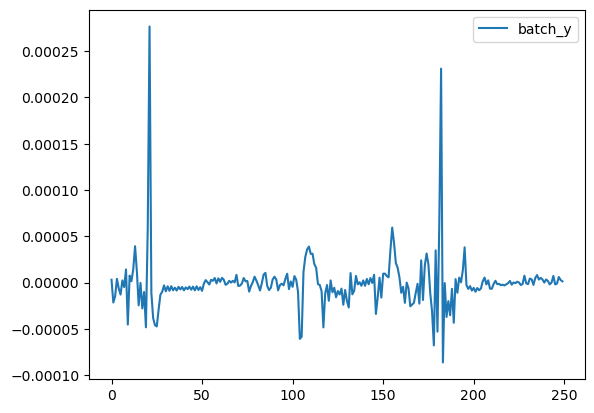

In [149]:
df2=pd.DataFrame(batch_y,columns=['batch_y'])
df2.plot()

<AxesSubplot:>

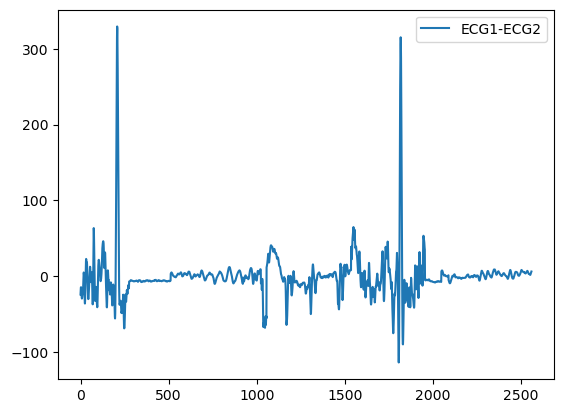

In [147]:
slice10_df = df.iloc[512*0:512*5, 16:17]
slice10_df
slice10_df.plot()

In [18]:
csvFile="G:/cap-sleep-database-1.0.0/cap-sleep-database-1.0.0/np_data/output5.csv"

In [21]:
def __master_csv(csvFile, recordName, num):
    data = pd.read_csv(csvFile)
    pt_data = data[data['Filename'] == recordName + ".csv"]
    
    record_start_dict = {}
    
    for _, row in pt_data.iterrows():
        filename = row['Filename']
        start_index = row['Start Index']
        value = row['Start Value']
        
        if filename not in record_start_dict:
            record_start_dict[filename] = []
        
        record_start_dict[filename].append((start_index, value))
    
    if recordName + ".csv" in record_start_dict:
        start_index_value_pairs = record_start_dict[recordName + ".csv"]
        if len(start_index_value_pairs) > num:
            specific_start_index, specific_value = start_index_value_pairs[num]
#             print(f"The {num}th start_index for {recordName}.csv is: {specific_start_index}")
#             print(f"The corresponding value is: {specific_value}")
    
    return record_start_dict,specific_start_index,specific_value


In [22]:
record_start_dict,specific_start_index,specific_value= __master_csv(csvFile,"brux1",2)
print(specific_start_index)
print(specific_value)

3000
-4.130892585975091e-06


In [25]:
class DataGenerator(keras.utils.Sequence):
    record_start_dict = {}
    specific_start_index = None
    specific_value = None
    
    def __init__(self, csv_file, batch_size=50, n_classes=10, shuffle=False):
        self.batch_size = batch_size
        self.n_classes = n_classes
        self.shuffle = shuffle
        
        # Load the CSV file
        self.data = pd.read_csv(csv_file, header=None)
        
        # Get the unique IDs from the CSV file
        self.list_IDs = np.arange(len(self.data))
        
        self.on_epoch_end()
    
    def __len__(self):
        return int(np.floor(len(self.list_IDs) / self.batch_size))
    
    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size: (index + 1) * self.batch_size]
        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        
        X, y = self.__data_generation(list_IDs_temp)
        
        return X, y
    
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle:
            np.random.shuffle(self.indexes)
    
    def __data_generation(self, list_IDs_temp):
        batch_data = self.data.iloc[list_IDs_temp]
        X = batch_data.iloc[:, :-1].values
        y = batch_data.iloc[:, -1].values
        
        csvFile = "your_csv_file.csv"
        recordName = "brux1"
        num = 30
        
        record_start_dict, specific_start_index, specific_value = self.__master_csv(csvFile, recordName, num)
        
        return X, y
    
    def __master_csv(self, master_csvFile, recordName, num):
        data = pd.read_csv(master_csvFile)
        pt_data = data[data['Filename'] == recordName + ".csv"]
    
        for _, row in pt_data.iterrows():
            filename = row['Filename']
            start_index = row['Start Index']
            value = row['Start Value']
        
            if filename not in self.record_start_dict:
                self.record_start_dict[filename] = []
        
            self.record_start_dict[filename].append((start_index, value))
    
        if recordName + ".csv" in self.record_start_dict:
            start_index_value_pairs = self.record_start_dict[recordName + ".csv"]
            if len(start_index_value_pairs) > num:
                self.specific_start_index, self.specific_value = start_index_value_pairs[num]
    
        return self.record_start_dict, self.specific_start_index, self.specific_value
